In [1]:
import pickle
import numpy as np
import xgboost as xgb
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, make_scorer
import matplotlib.pyplot as plt
import scipy.stats as stats
from psid_accuracy import psid_metrics


Reading /home/tidiane/dev/bsd_lab/psid/data/VP8_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7503.33 ms
        0 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
215 matching events found
No baseline correction applied
0 projection items activated
Reading data/VP8_ica.fif ...
Now restoring ICA solution ...
Ready.
NB SPLITS :  9


/home/tidiane/dev/bsd_lab/psid/utils/psid_standalone_original.py:86: RuntimeWarning: invalid value encountered in true_divide
  Z = np.nan_to_num((Z.data - means_z) / std_z)


Processing split 1


KeyboardInterrupt: 

In [2]:
import pickle
import numpy as np
import xgboost as xgb
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, make_scorer
import matplotlib.pyplot as plt
import scipy.stats as stats
from psid_accuracy import psid_metrics


Reading /home/tidiane/dev/bsd_lab/psid/data/VP8_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7503.33 ms
        0 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
215 matching events found
No baseline correction applied
0 projection items activated
Reading data/VP8_ica.fif ...
Now restoring ICA solution ...
Ready.
NB SPLITS :  9


KeyboardInterrupt: 

In [ ]:
import xgboost as xgb
from sklearn.model_selection import KFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, make_scorer

cv = KFold(n_splits=5, shuffle=True)
scorer = make_scorer(accuracy_score)
model = xgb.XGBClassifier(max_depth=5,
                          n_estimators=10,
                          n_jobs=3,
                          eval_metric="logloss",
                          use_label_encoder=False)
model = LinearDiscriminantAnalysis("eigen",shrinkage="auto")

In [ ]:
# Z and Y reproduction for exp 1

In [6]:

#exps = [str(n) for n in ["1"]]
behav_var_list = ["all"]#,"stim","no_stim"]
n1_list = [2,5,10,15,20,30]
n1 = 5
corr_list, dist_list, scores_list, scores_test_only_list = [], [], [], []


exp = "1"
for behav_var in behav_var_list:

    #with open('../results/psid_features_' + exp + "_" + behav_var + "_n1_" + str(n1) + '.pickle', 'rb') as handle:
    #    result_dicts = pickle.load(handle)#, protocol=pickle.HIGHEST_PROTOCOL)

    with open('results/psid_features_result_dicts.pickle', 'rb') as handle:
        result_dicts = pickle.load(handle)#, protocol=pickle.HIGHEST_PROTOCOL)

    corr, dist, scores, scores_test_only = psid_metrics(result_dicts)
    corr_list.append(corr)
    dist_list.append(dist)
    scores_list.append(scores)
    scores_test_only_list.append(scores_test_only)

plt.boxplot(corr_list, labels=behav_var_list)
plt.title("Kendall's Tau")
plt.show()
plt.boxplot(dist_list, labels=behav_var_list)
plt.title("Distance")
plt.show()
plt.boxplot(scores_list, labels=behav_var_list)
plt.title("classif accuracy")
plt.show()
plt.boxplot(scores_test_only_list,  labels=behav_var_list)
plt.title("classif accuracy (on test data only)")
plt.show()

EOFError: Ran out of input

EXP  1
[0.6944444444444444, 0.7638888888888888, 0.6527777777777778, 0.9444444444444444, 0.6388888888888888] 0.7388888888888888
[0.9333333333333333, 0.8666666666666667, 0.5714285714285714, 0.7857142857142857, 0.7142857142857143, 0.8666666666666667, 0.4666666666666667, 0.9285714285714286, 0.6428571428571429, 0.8571428571428571, 0.8666666666666667, 0.6666666666666666, 0.7857142857142857, 0.6428571428571429, 0.7142857142857143, 0.9333333333333333, 1.0, 0.9285714285714286, 0.9285714285714286, 0.9285714285714286, 0.8666666666666667, 0.7333333333333333, 0.8571428571428571, 0.6428571428571429, 0.7857142857142857] 0.7965714285714286


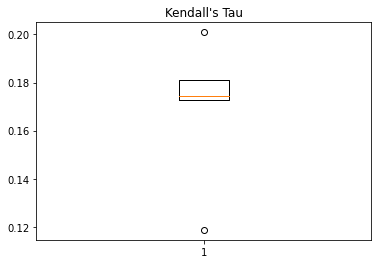

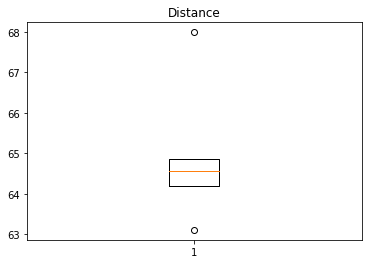

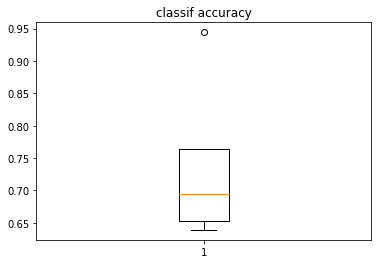

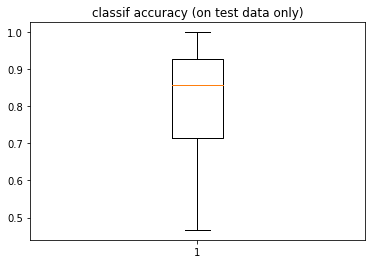

In [16]:
exp = "1"
print("EXP ",exp)
scores = []
with open("../results/psid_data_rec_" + exp + "_all.pickle", 'rb') as handle:
    result_dicts = pickle.load(handle)

dist = []
corr = []
scores = []
scores_test_only = []

for split_idx, res in enumerate(result_dicts):

    Z_true = res["Z_true"]
    Z_pred = res["Z_pred"]
    Y_true = res["Y_true"]
    Y_pred = res["Y_pred"]
    X_train = res["X_train"]
    y_train = res["y_train"]
    X_test = res["X_test"]
    y_test = res["y_test"]

    Z_true_concat = np.hstack(Z_true) # (n_channels, n_epochs*n_times)
    Z_pred_concat = np.hstack(Z_pred) # (n_channels, n_epochs*n_times)


    Z_kendall = np.asarray([stats.kendalltau(Zt, Zp)[0] for Zt, Zp in zip(Z_true_concat, Z_pred_concat)])
    Z_dist = np.linalg.norm(Z_true_concat-Z_pred_concat, axis=1)
    
    corr.append(Z_kendall[-1])
    dist.append(Z_dist[-1])

    model.fit(X_train,y_train)
    scores.append(scorer(model,X_test,y_test))

    classif_splits = list(cv.split(X_test, y_test))
    for isplit, (classif_ix_train, classif_ix_test) in enumerate(classif_splits):
        model.fit(X_test[classif_ix_train], y_test[classif_ix_train])

        scores_test_only.append(scorer(model, X_test[classif_ix_test], y_test[classif_ix_test]))

print(scores,np.mean(scores))
print(scores_test_only,np.mean(scores_test_only))
plt.boxplot(corr)
plt.title("Kendall's Tau")
plt.show()
plt.boxplot(dist)
plt.title("Distance")
plt.show()
plt.boxplot(scores)
plt.title("classif accuracy")
plt.show()
plt.boxplot(scores_test_only)
plt.title("classif accuracy (on test data only)")
plt.show()



In [ ]:
exp = "1"
print("EXP ",exp)
scores = []
with open("../results/psid_data_rec_" + exp + ".pickle", 'rb') as handle:
    result_dicts = pickle.load(handle)

dist = []
corr = []

for split_idx, res in enumerate(result_dicts):

    Z_true = res["Z_true"]
    Z_pred = res["Z_pred"]
    Y_true = res["Y_true"]
    Y_pred = res["Y_pred"]

    Z_true_concat = np.hstack(Z_true) # (n_channels, n_epochs*n_times)
    Z_pred_concat = np.hstack(Z_pred) # (n_channels, n_epochs*n_times)


    Z_kendall = np.asarray([stats.kendalltau(Zt, Zp)[0] for Zt, Zp in zip(Z_true_concat, Z_pred_concat)])
    Z_dist = np.linalg.norm(Z_true_concat-Z_pred_concat, axis=1)
    
    corr.append(Z_kendall)
    dist.append(Z_dist)

plt.boxplot([c for c in np.transpose(corr)])
plt.title("Kendall's Tau")
plt.show()
plt.boxplot([c for c in np.transpose(dist)])
plt.title("Distance")
plt.show()

print("Kendall's Tau for stim")
print(np.mean(corr, axis=0)[-1])
print("Distance for stim")
print(np.mean(dist, axis=0)[-1])


EXP  1


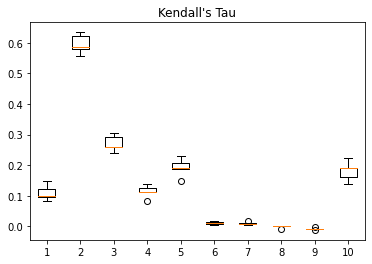

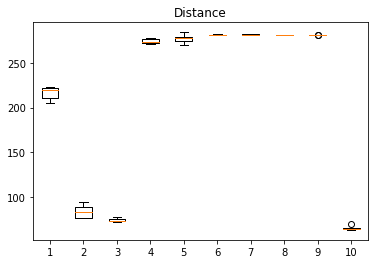

Kendall's Tau for stim
0.18049216168554252
Distance for stim
65.5558445226446


EXP  1


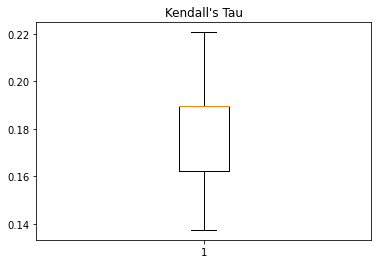

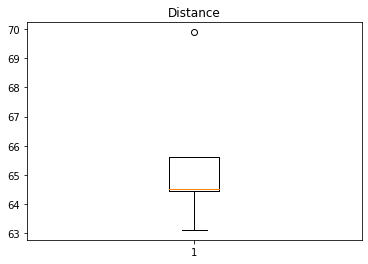

Kendall's Tau for stim
0.17989904791020478
Distance for stim
65.51409778851205


In [40]:
exp = "1"
print("EXP ",exp)
scores = []
with open("../results/psid_data_rec_" + exp + "_stim.pickle", 'rb') as handle:
    result_dicts = pickle.load(handle)

dist = []
corr = []

for split_idx, res in enumerate(result_dicts):

    Z_true = res["Z_true"]
    Z_pred = res["Z_pred"]
    Y_true = res["Y_true"]
    Y_pred = res["Y_pred"]

    Z_true_concat = np.hstack(Z_true) # (n_channels, n_epochs*n_times)
    Z_pred_concat = np.hstack(Z_pred) # (n_channels, n_epochs*n_times)


    Z_kendall = np.asarray([stats.kendalltau(Zt, Zp)[0] for Zt, Zp in zip(Z_true_concat, Z_pred_concat)])
    Z_dist = np.linalg.norm(Z_true_concat-Z_pred_concat, axis=1)
    
    corr.append(Z_kendall)
    dist.append(Z_dist)

plt.boxplot([c for c in np.transpose(corr)])
plt.title("Kendall's Tau")
plt.show()
plt.boxplot([c for c in np.transpose(dist)])
plt.title("Distance")
plt.show()

print("Kendall's Tau for stim")
print(np.mean(corr, axis=0)[-1])
print("Distance for stim")
print(np.mean(dist, axis=0)[-1])


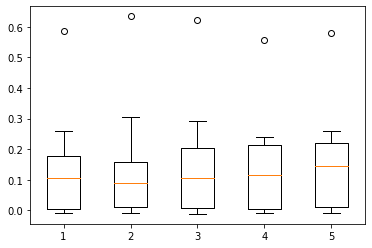

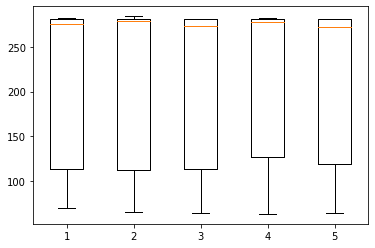

In [28]:
#boxplot of transposed corr items
corr_transposed = np.transpose(np.asarray(corr))
plt.boxplot(corr)
plt.show()
#boxplot of transposed dist items
dist_transposed = np.transpose(np.asarray(dist))
plt.boxplot(dist)
plt.show()


In [ ]:
# DATA REPRODUCTION

In [ ]:
exps = [str(n) for n in [1]]

EXP  1
test epoch  0
(10, 3304)
(10, 3304)


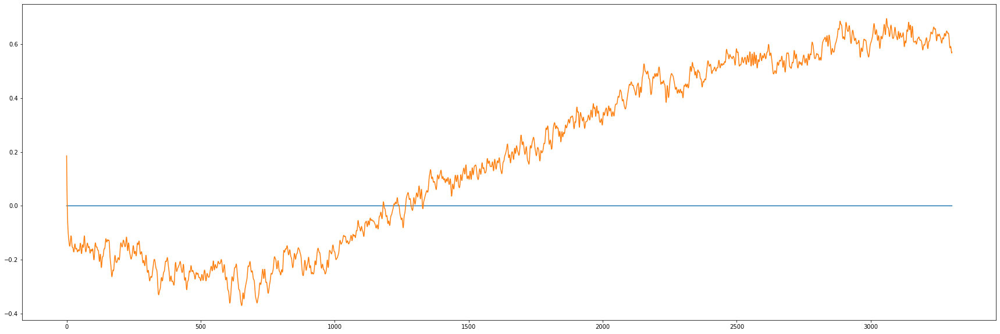

test epoch  1
(10, 3304)
(10, 3304)


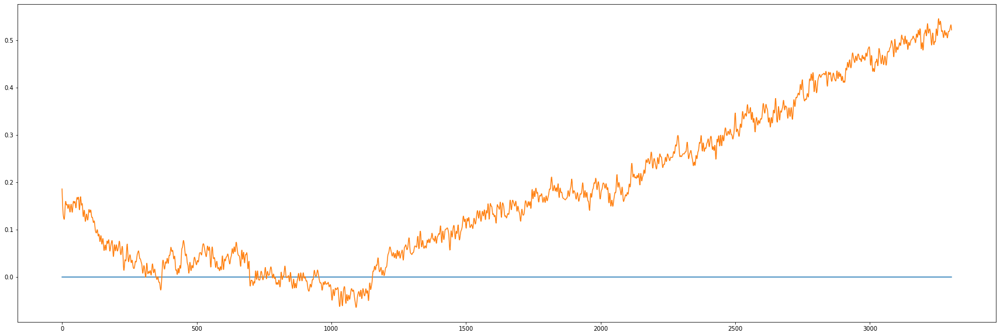

test epoch  2
(10, 3304)
(10, 3304)


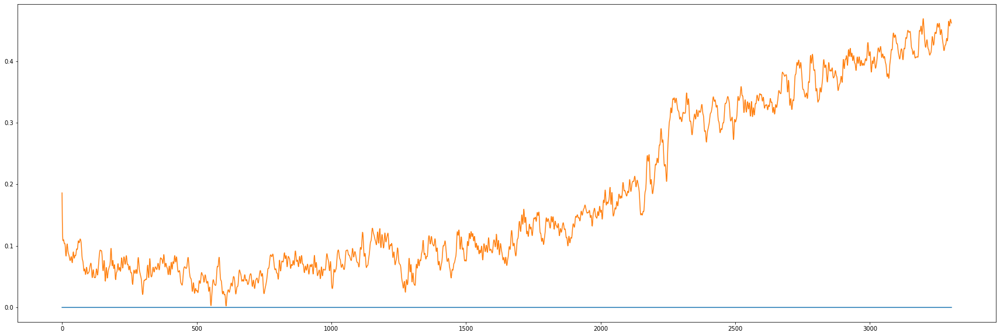

test epoch  3
(10, 3304)
(10, 3304)


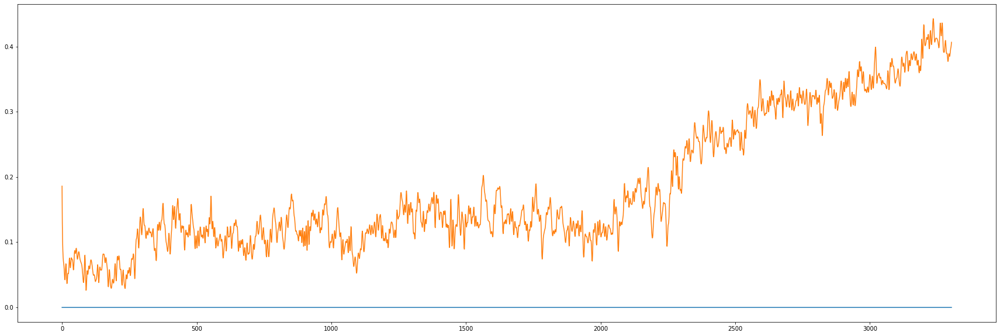

test epoch  4
(10, 3304)
(10, 3304)


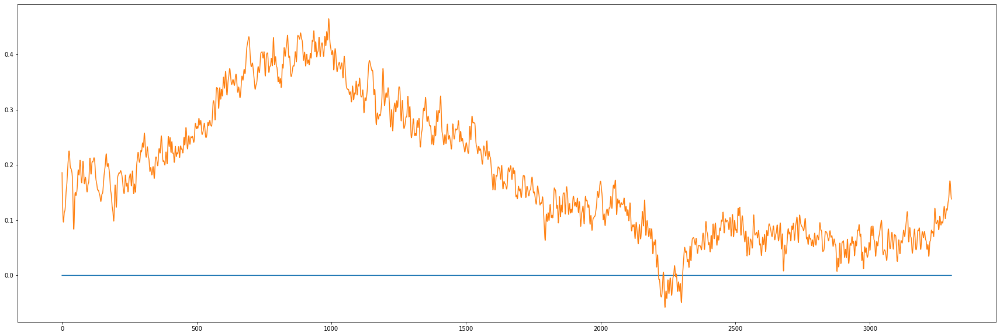

test epoch  5
(10, 3304)
(10, 3304)


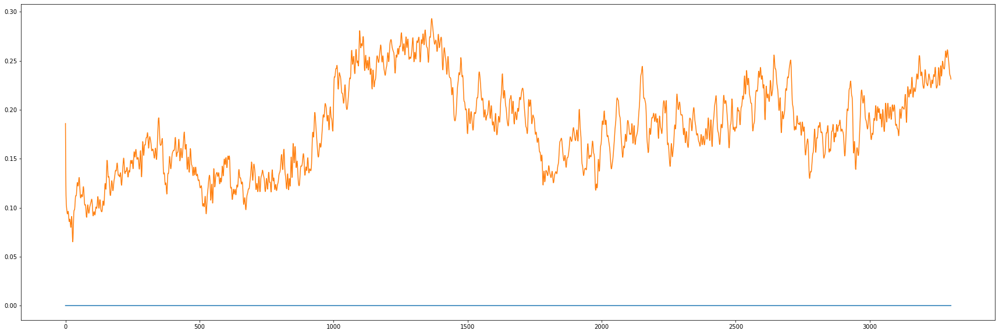

test epoch  6
(10, 3304)
(10, 3304)


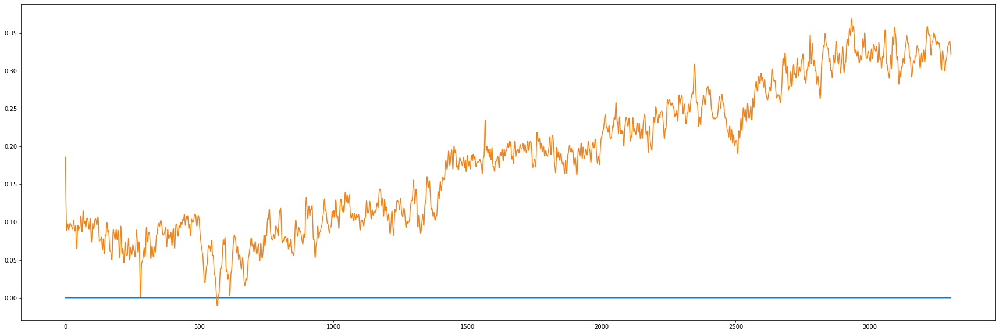

test epoch  7
(10, 3304)
(10, 3304)


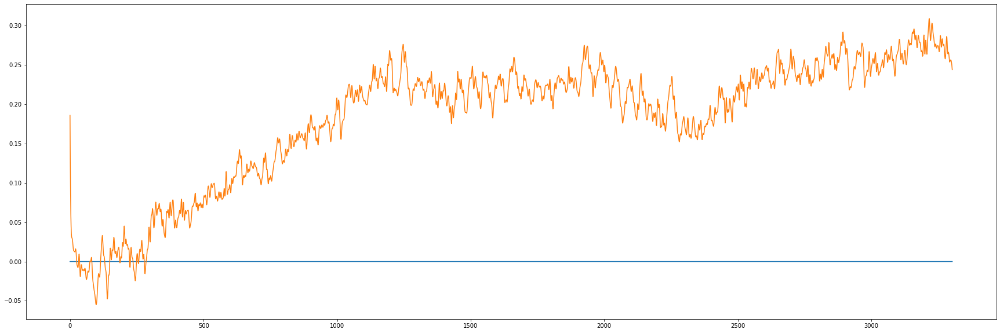

test epoch  8
(10, 3304)
(10, 3304)


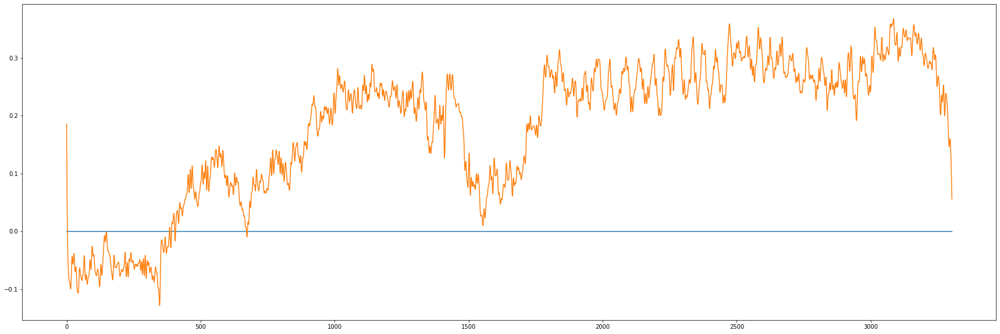

test epoch  9
(10, 3304)
(10, 3304)


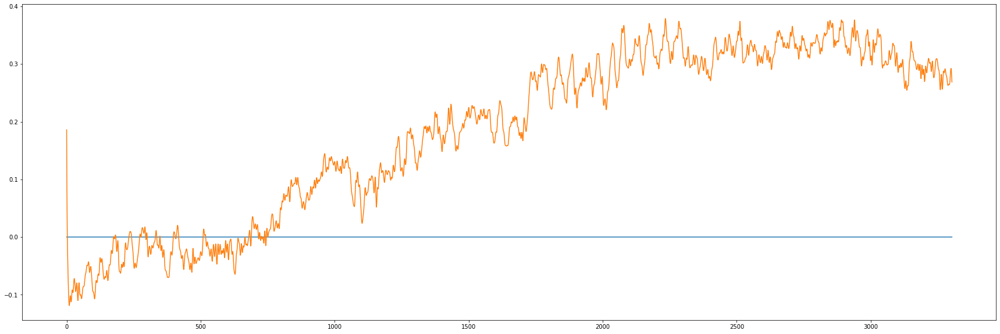

test epoch  10
(10, 3304)
(10, 3304)


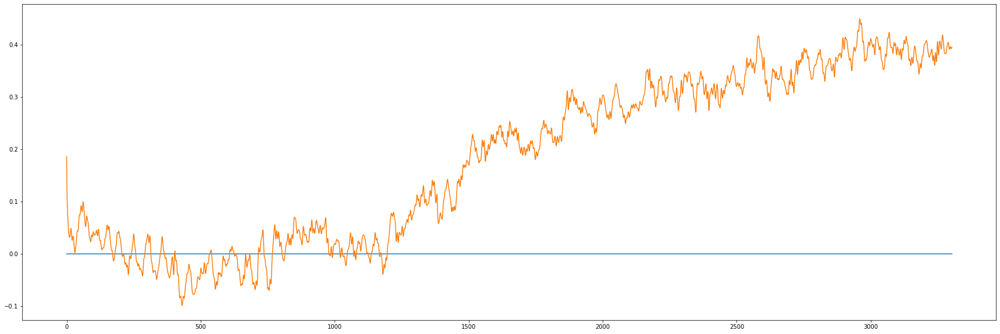

test epoch  11
(10, 3304)
(10, 3304)


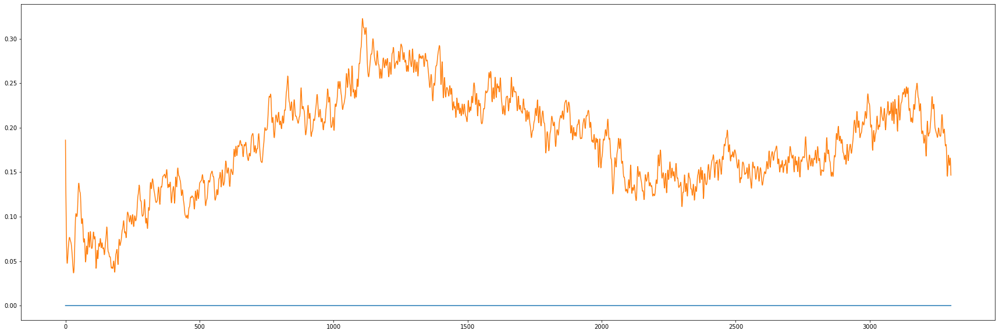

test epoch  12
(10, 3304)
(10, 3304)


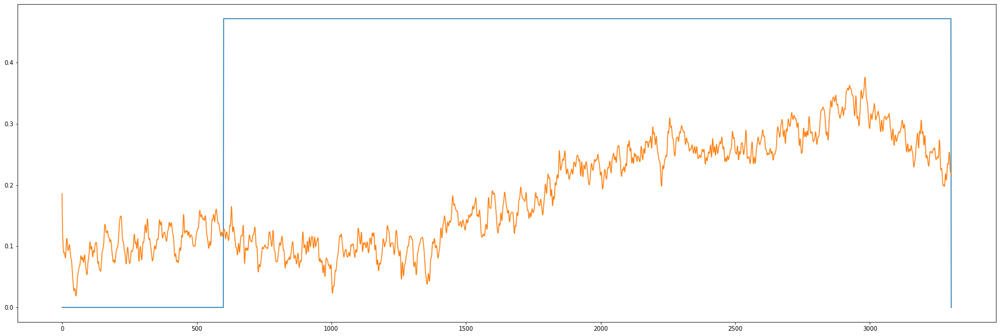

test epoch  13
(10, 3304)
(10, 3304)


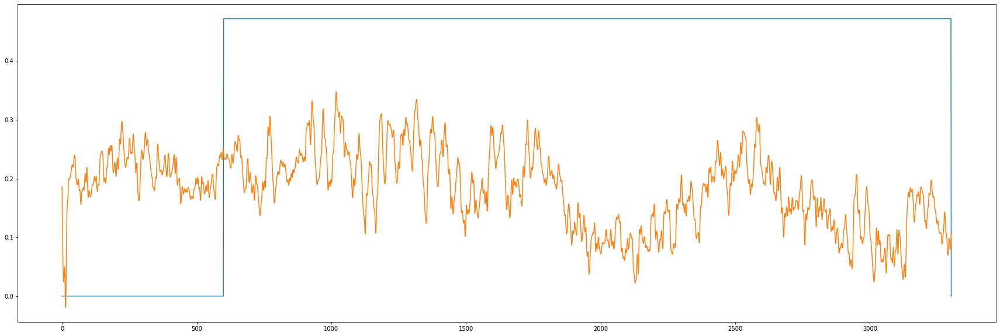

test epoch  14
(10, 3304)
(10, 3304)


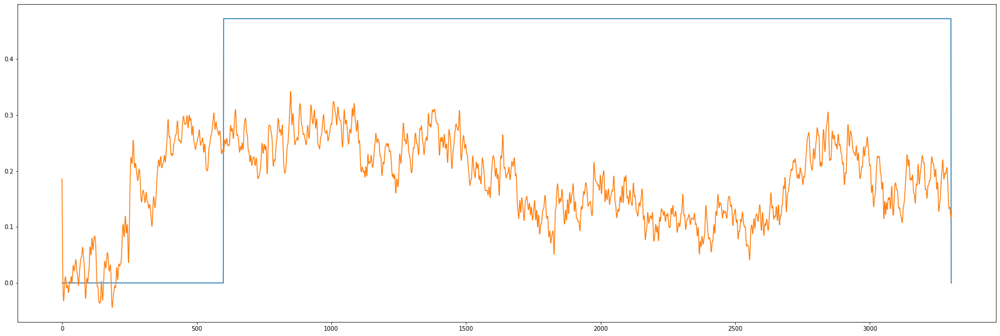

test epoch  15
(10, 3304)
(10, 3304)


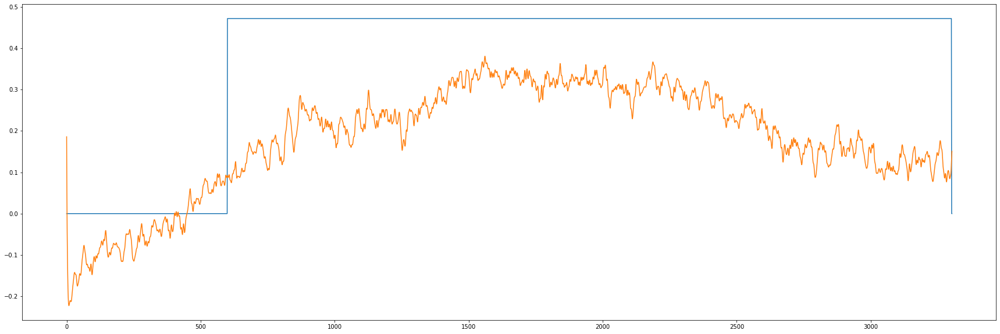

test epoch  16
(10, 3304)
(10, 3304)


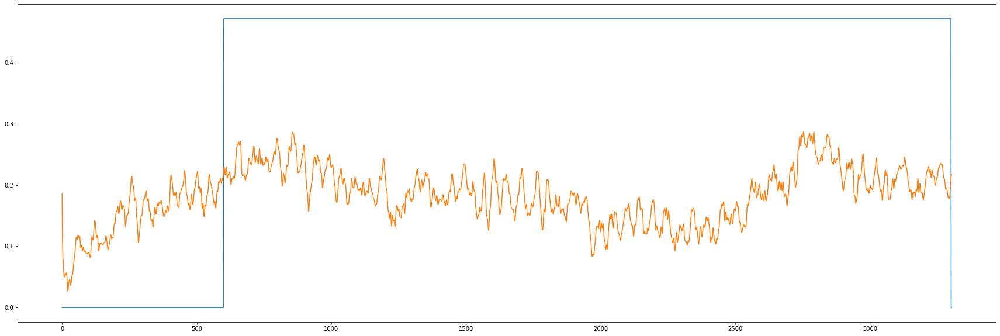

test epoch  17
(10, 3304)
(10, 3304)


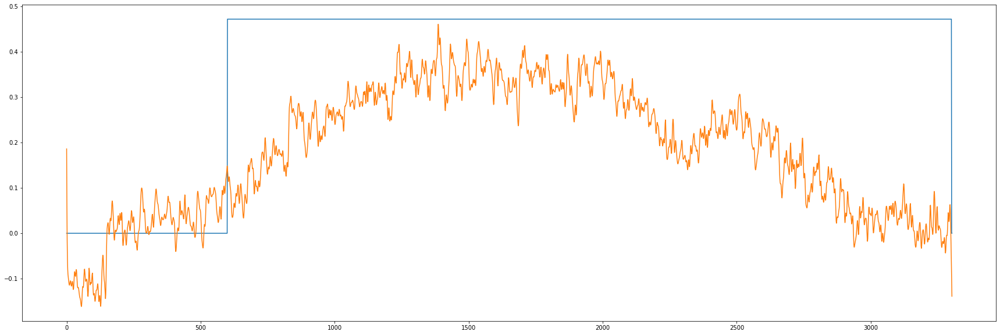

test epoch  18
(10, 3304)
(10, 3304)


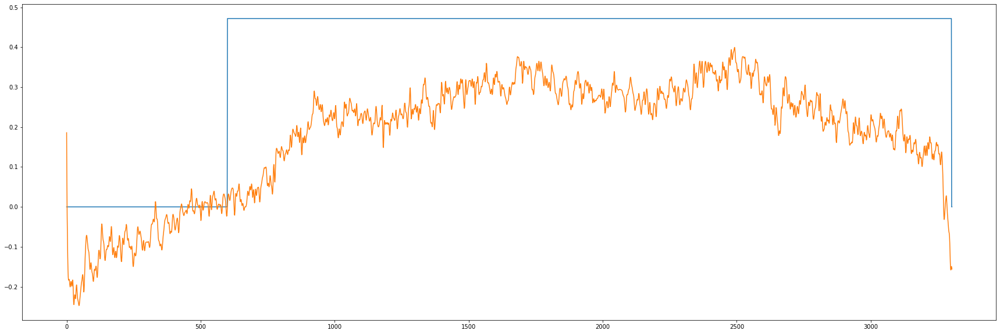

test epoch  19
(10, 3304)
(10, 3304)


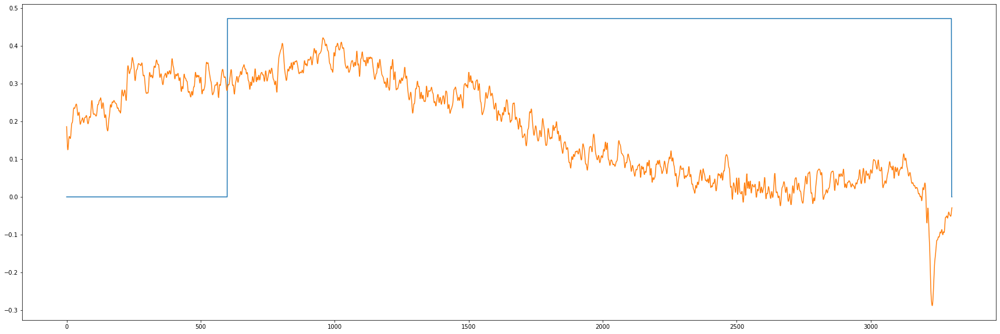

test epoch  20
(10, 3304)
(10, 3304)


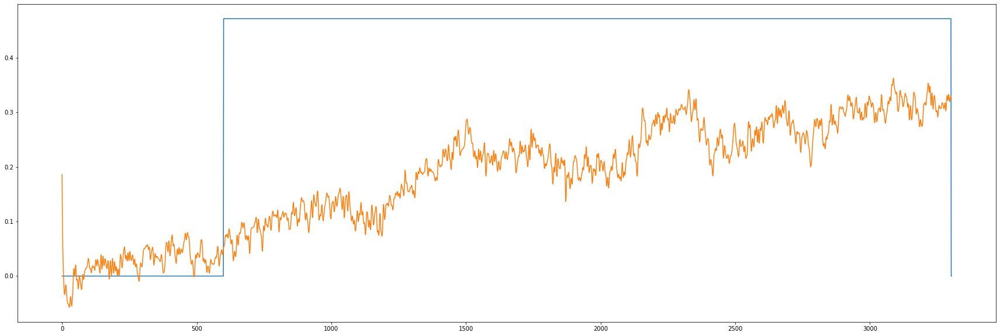

test epoch  21
(10, 3304)
(10, 3304)


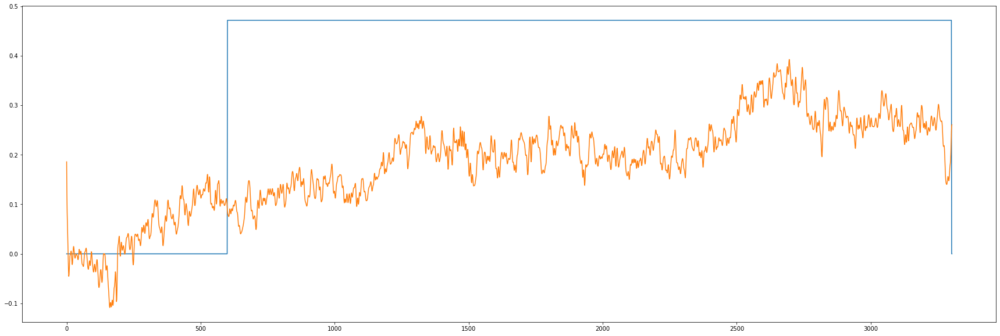

test epoch  22
(10, 3304)
(10, 3304)


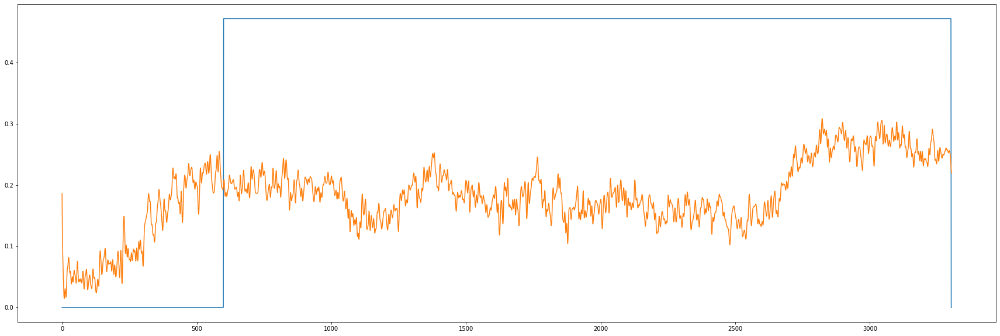

test epoch  23
(10, 3304)
(10, 3304)


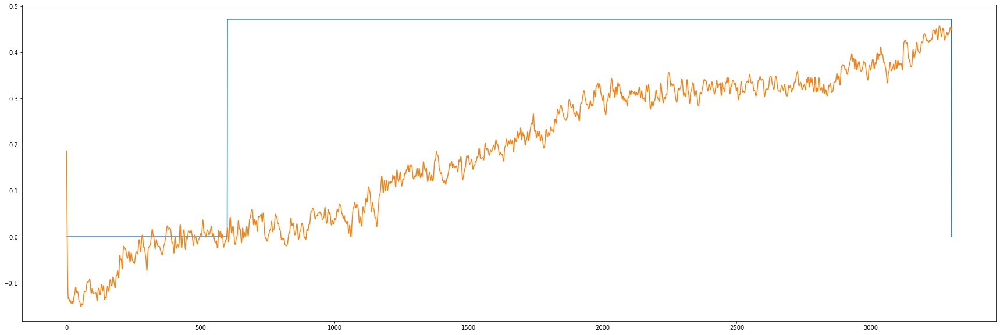

test epoch  0
(10, 3304)
(10, 3304)


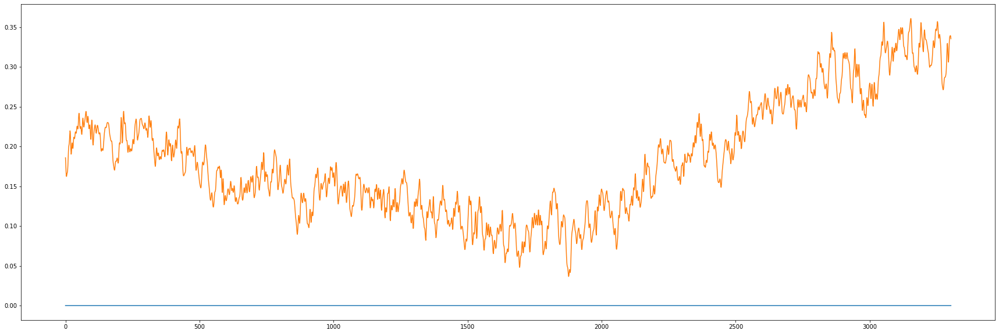

test epoch  1
(10, 3304)
(10, 3304)


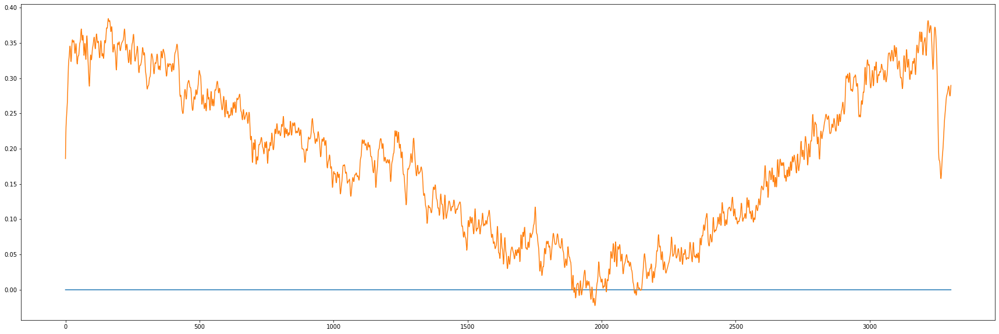

test epoch  2
(10, 3304)
(10, 3304)


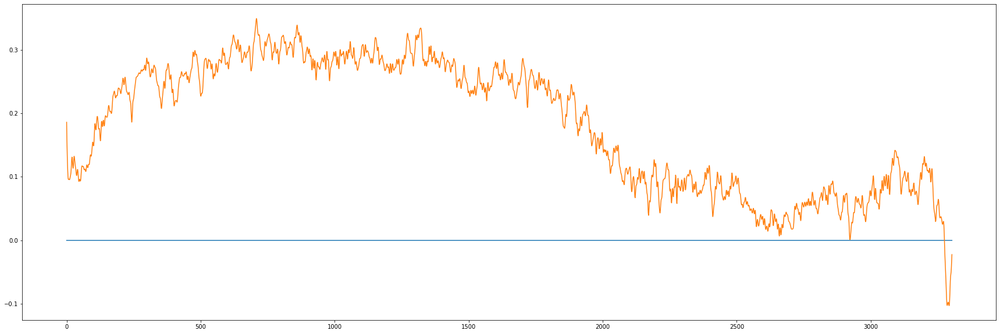

test epoch  3
(10, 3304)
(10, 3304)


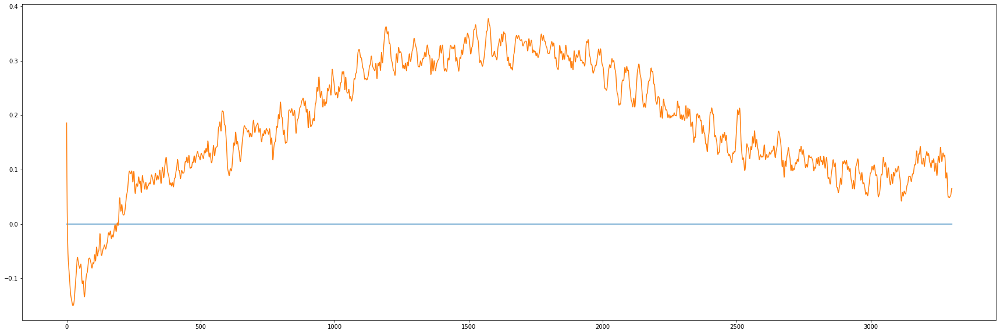

test epoch  4
(10, 3304)
(10, 3304)


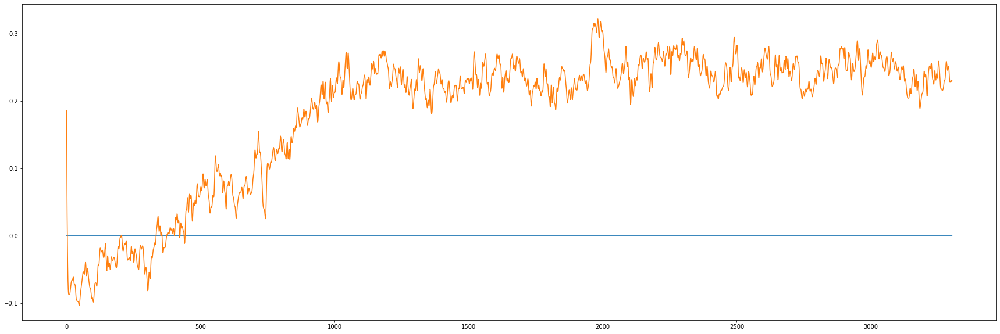

test epoch  5
(10, 3304)
(10, 3304)


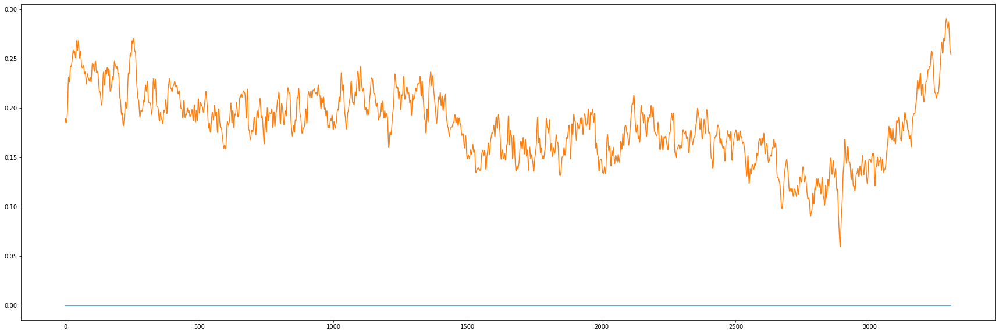

test epoch  6
(10, 3304)
(10, 3304)


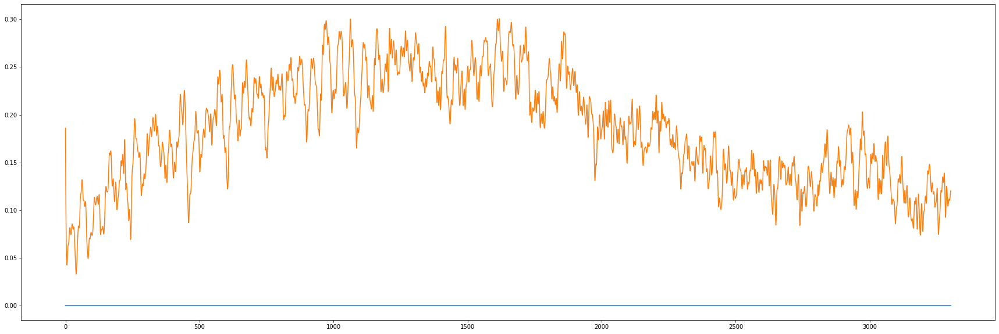

test epoch  7
(10, 3304)
(10, 3304)


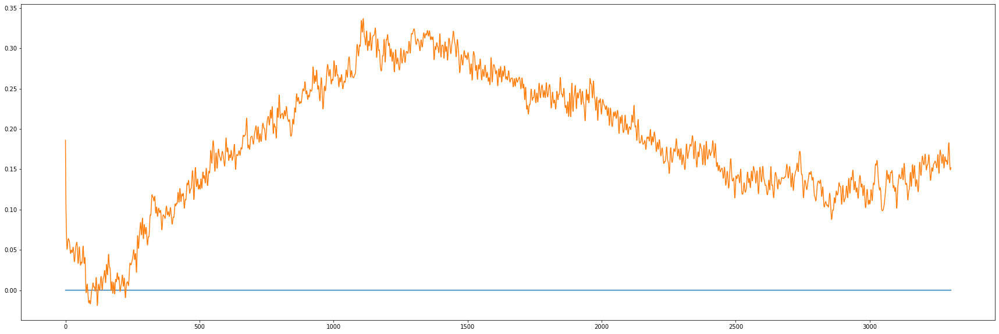

test epoch  8
(10, 3304)
(10, 3304)


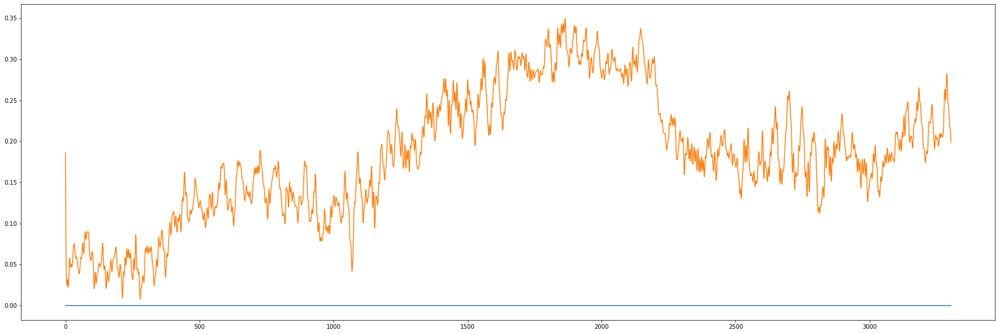

test epoch  9
(10, 3304)
(10, 3304)


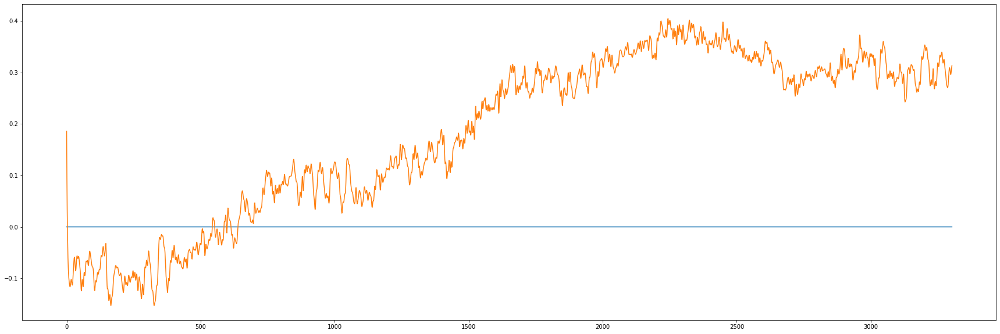

test epoch  10
(10, 3304)
(10, 3304)


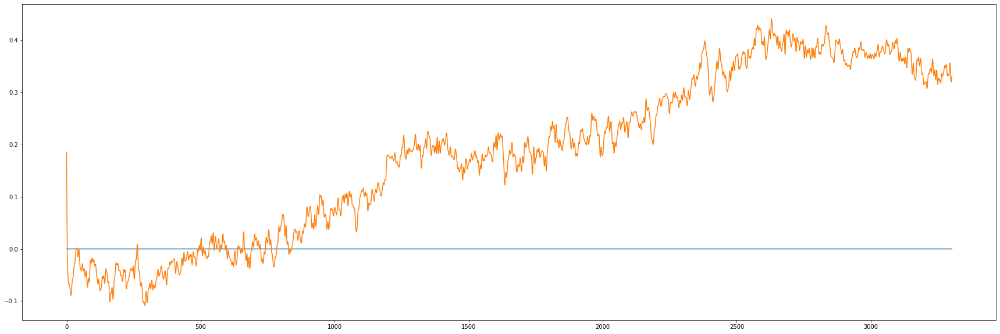

test epoch  11
(10, 3304)
(10, 3304)


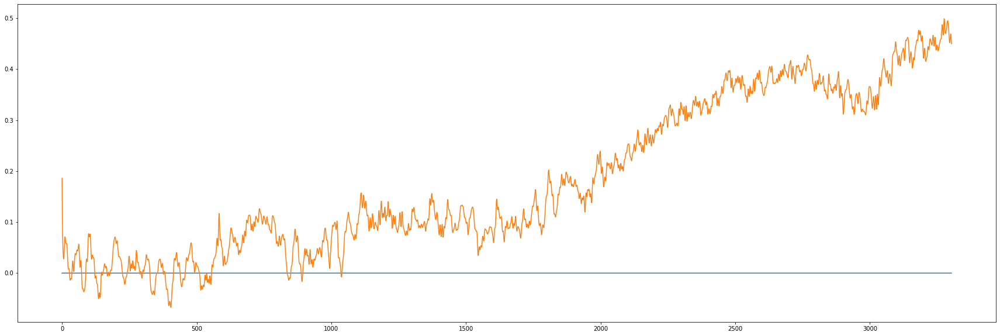

test epoch  12
(10, 3304)
(10, 3304)


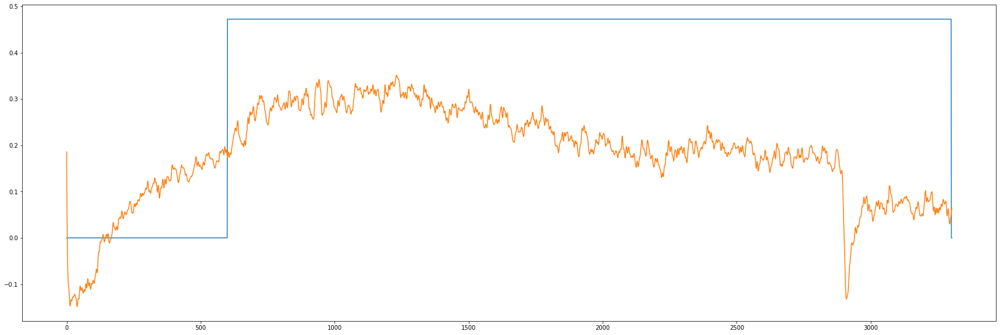

test epoch  13
(10, 3304)
(10, 3304)


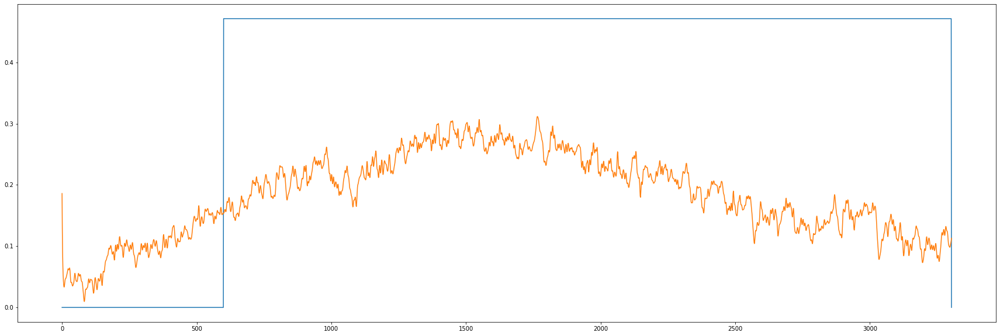

test epoch  14
(10, 3304)
(10, 3304)


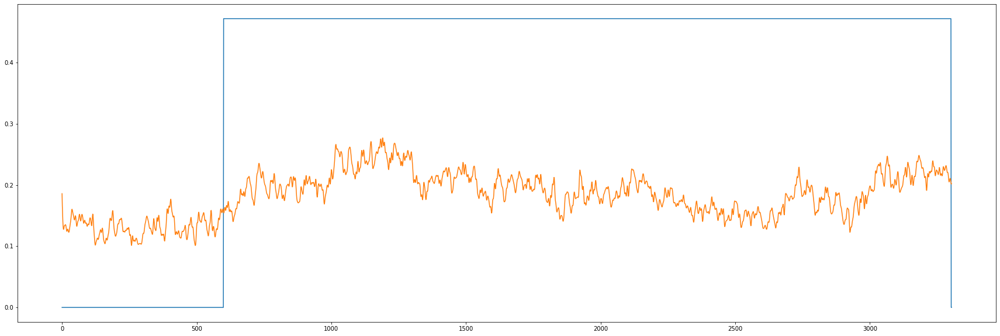

test epoch  15
(10, 3304)
(10, 3304)


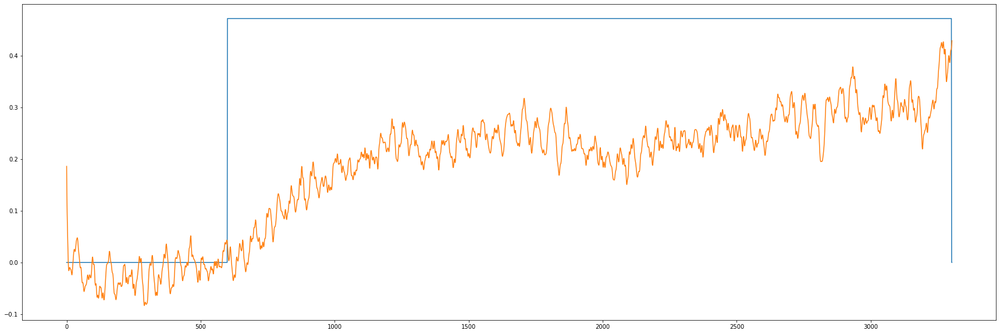

test epoch  16
(10, 3304)
(10, 3304)


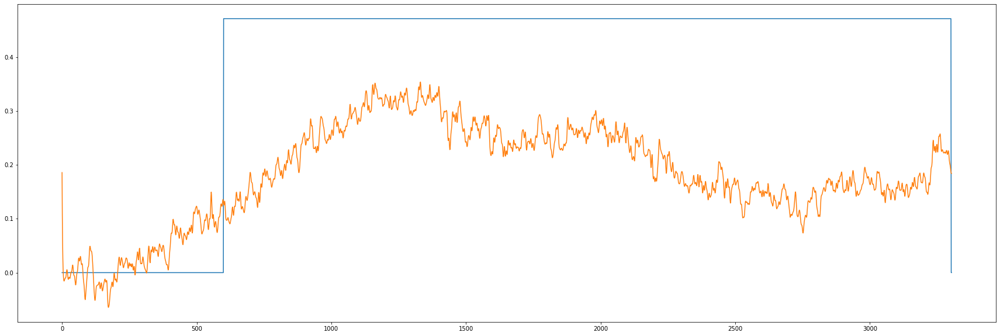

test epoch  17
(10, 3304)
(10, 3304)


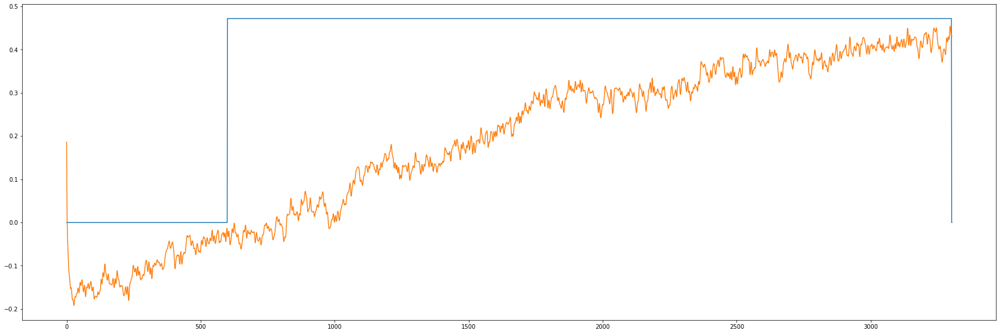

test epoch  18
(10, 3304)
(10, 3304)


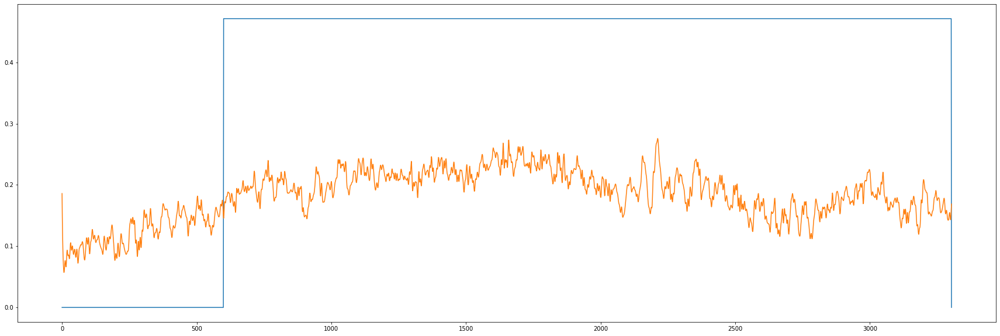

test epoch  19
(10, 3304)
(10, 3304)


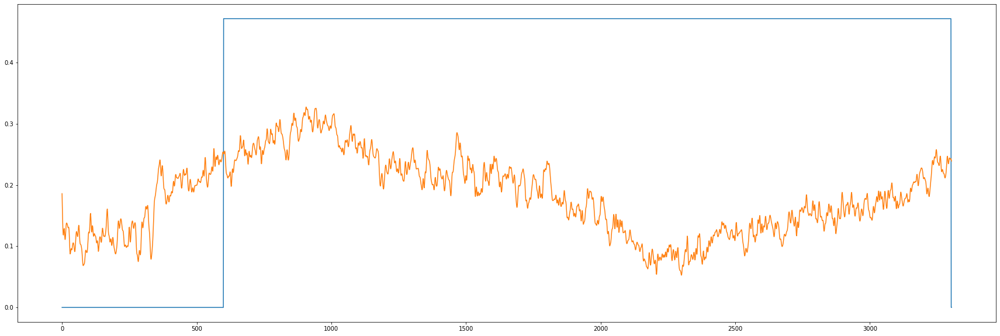

test epoch  20
(10, 3304)
(10, 3304)


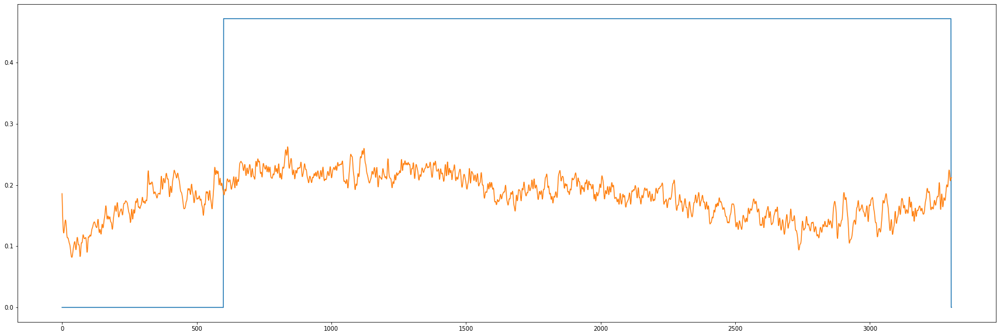

test epoch  21
(10, 3304)
(10, 3304)


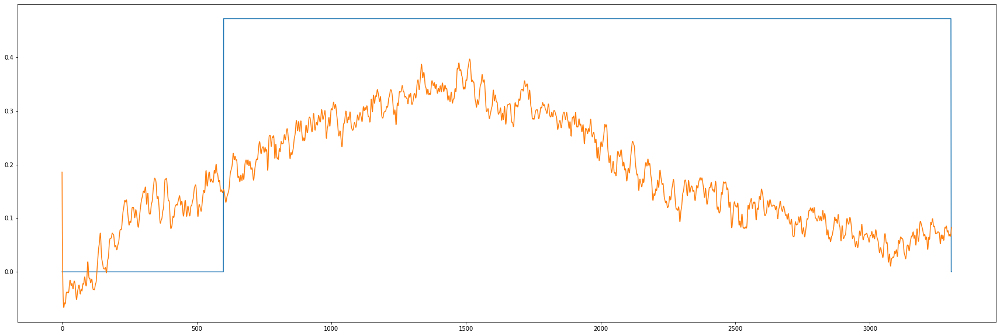

test epoch  22
(10, 3304)
(10, 3304)


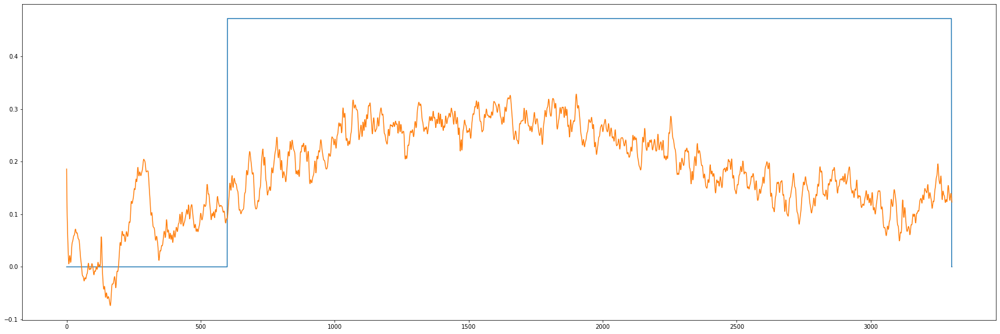

test epoch  23
(10, 3304)
(10, 3304)


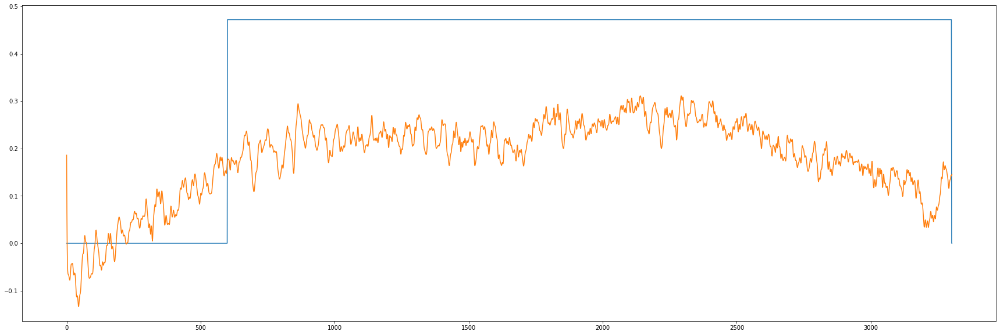

test epoch  0
(10, 3304)
(10, 3304)


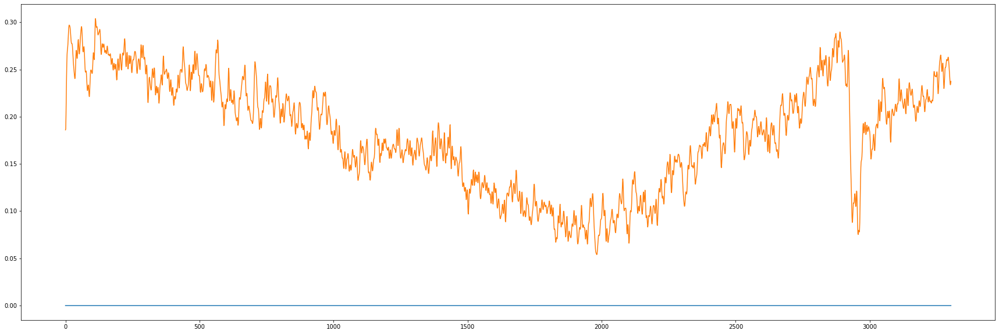

test epoch  1
(10, 3304)
(10, 3304)


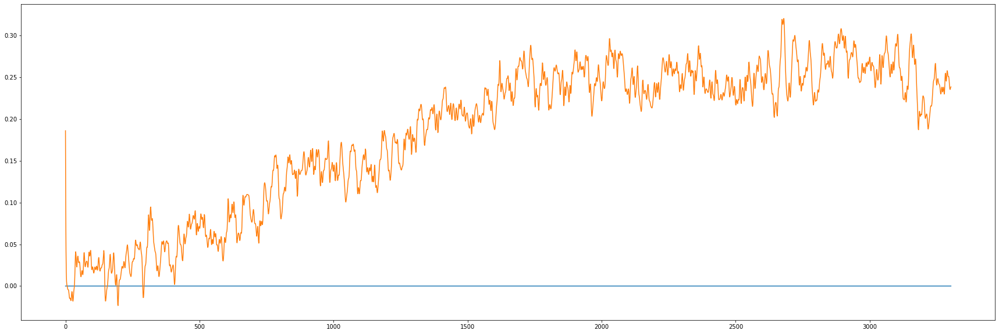

test epoch  2
(10, 3304)
(10, 3304)


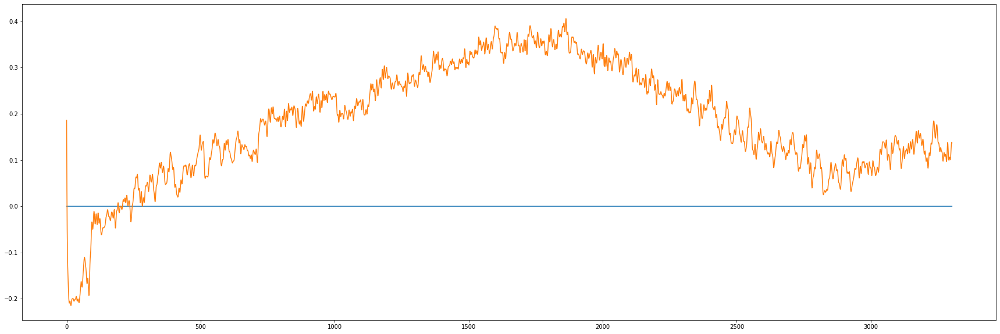

test epoch  3
(10, 3304)
(10, 3304)


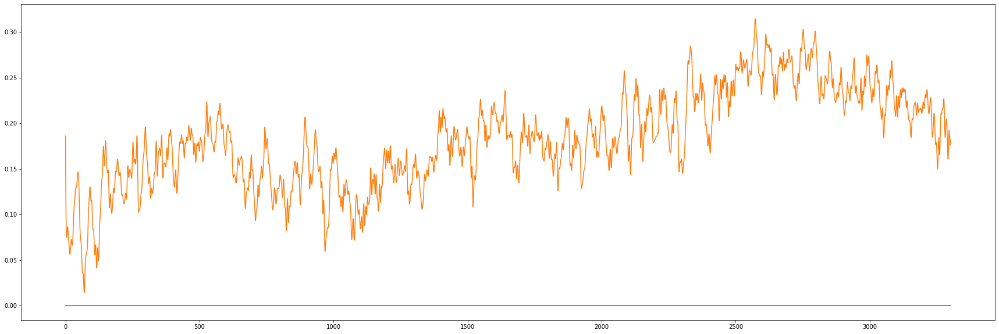

test epoch  4
(10, 3304)
(10, 3304)


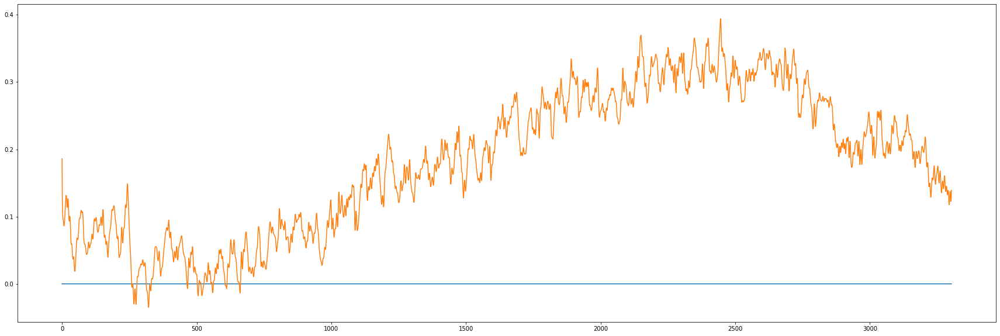

test epoch  5
(10, 3304)
(10, 3304)


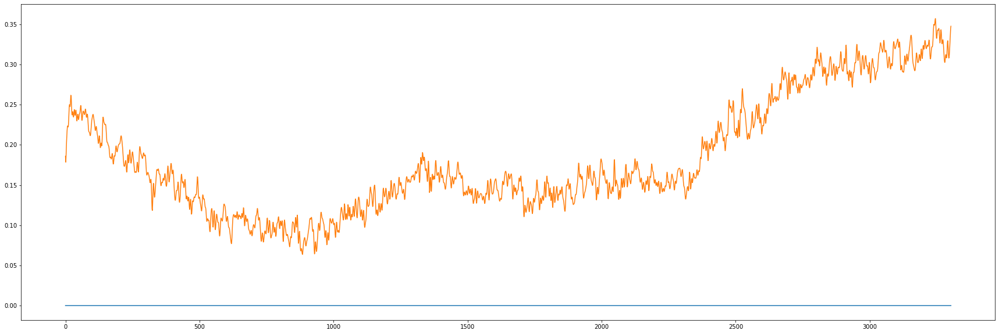

test epoch  6
(10, 3304)
(10, 3304)


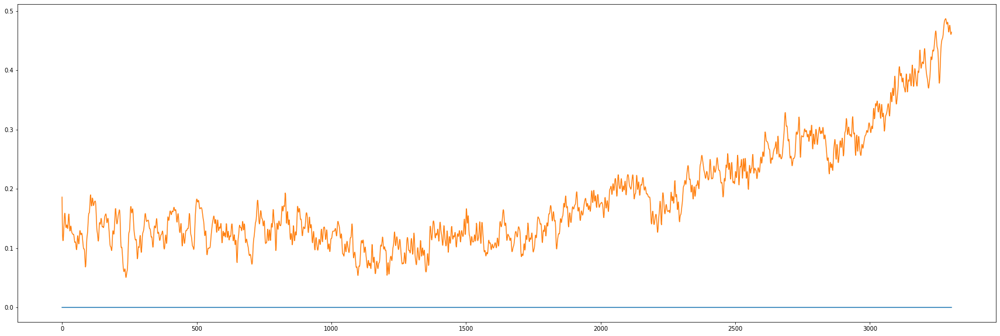

test epoch  7
(10, 3304)
(10, 3304)


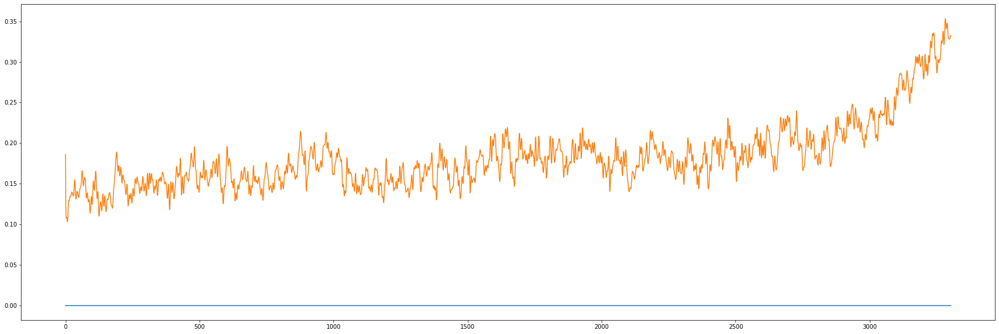

test epoch  8
(10, 3304)
(10, 3304)


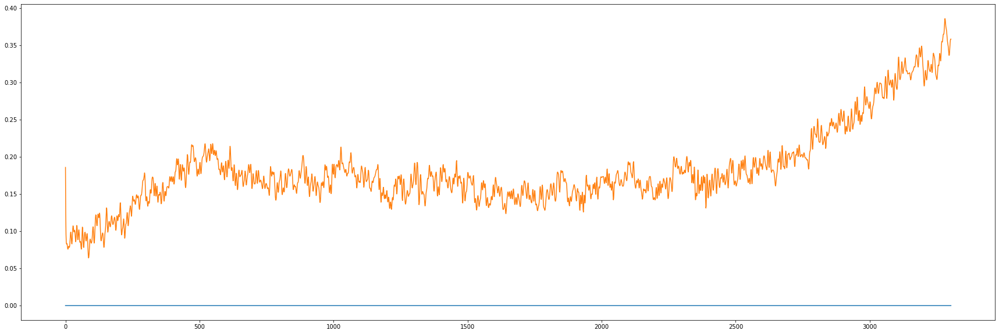

test epoch  9
(10, 3304)
(10, 3304)


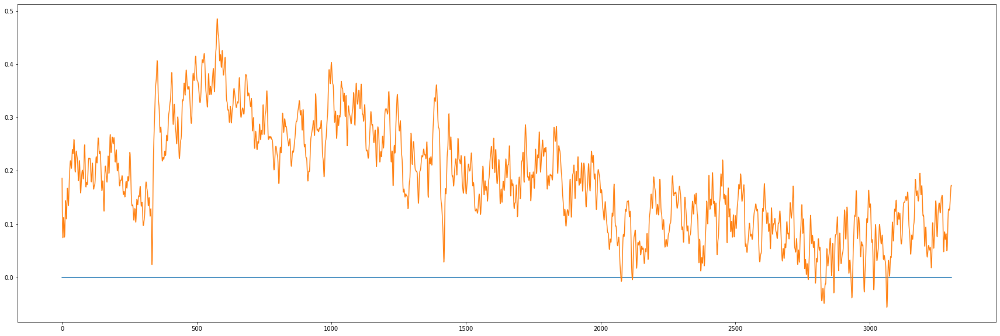

test epoch  10
(10, 3304)
(10, 3304)


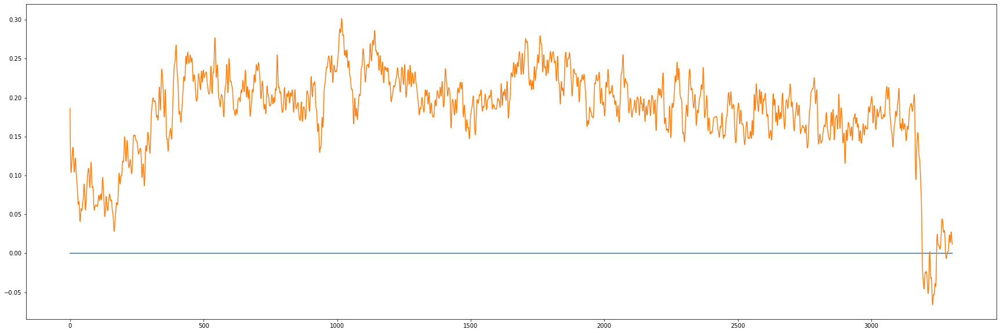

test epoch  11
(10, 3304)
(10, 3304)


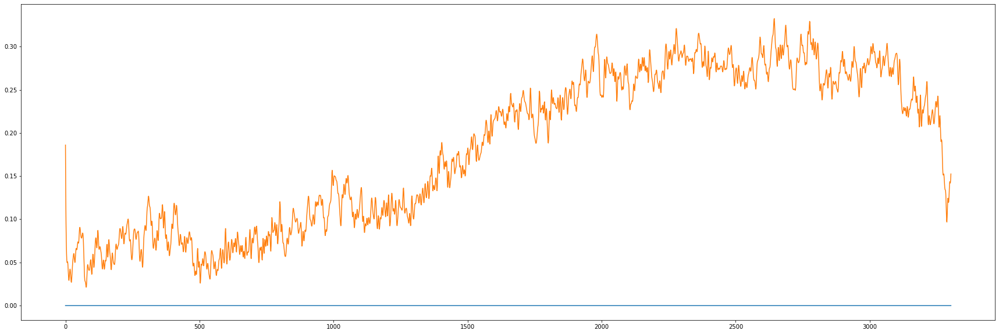

test epoch  12
(10, 3304)
(10, 3304)


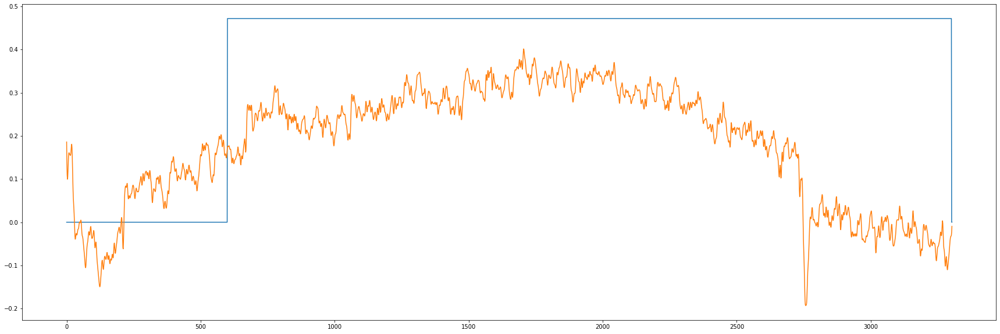

test epoch  13
(10, 3304)
(10, 3304)


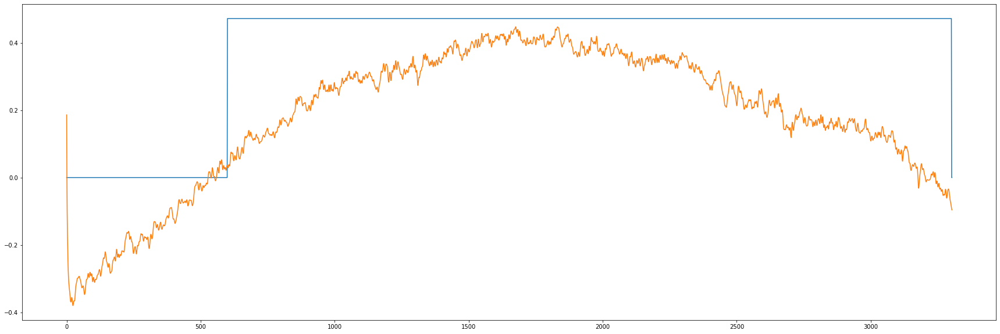

test epoch  14
(10, 3304)
(10, 3304)


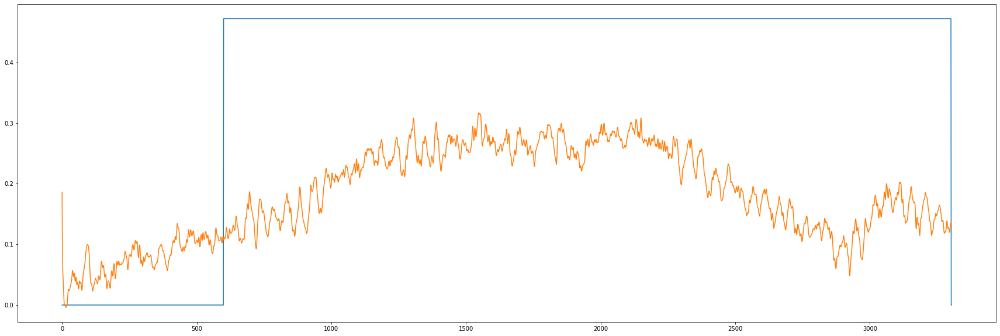

test epoch  15
(10, 3304)
(10, 3304)


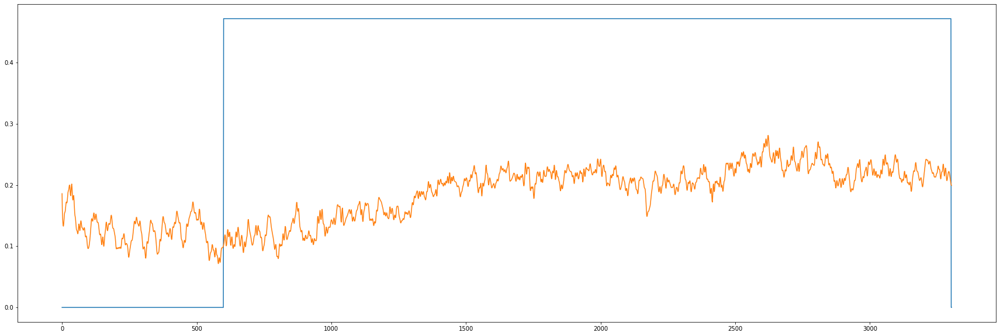

test epoch  16
(10, 3304)
(10, 3304)


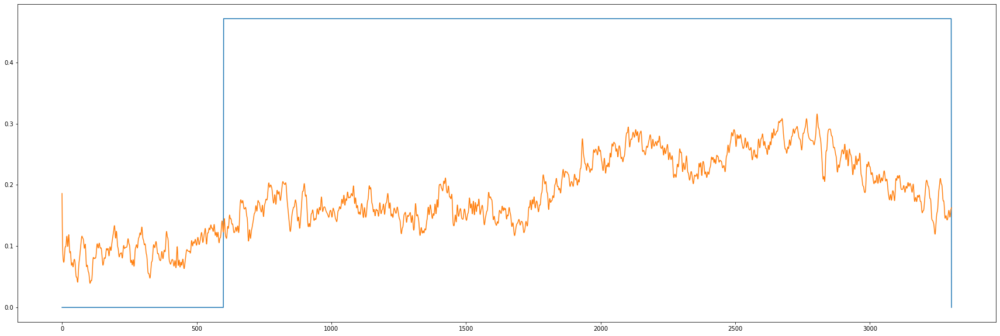

test epoch  17
(10, 3304)
(10, 3304)


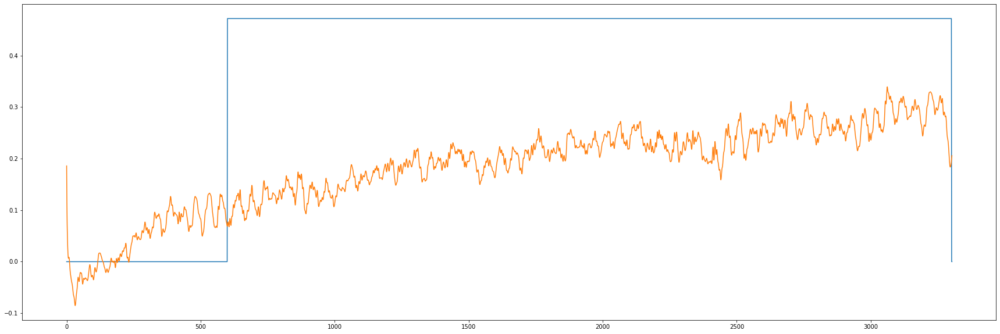

test epoch  18
(10, 3304)
(10, 3304)


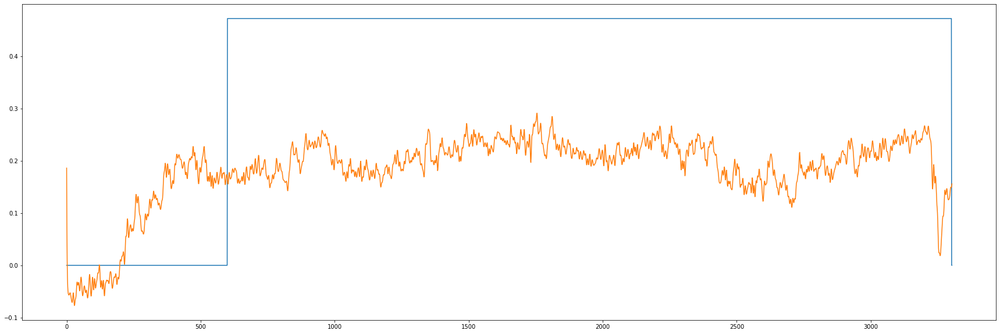

test epoch  19
(10, 3304)
(10, 3304)


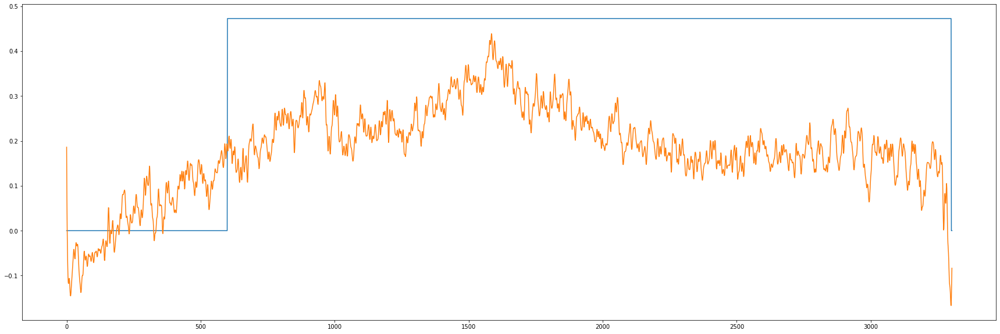

test epoch  20
(10, 3304)
(10, 3304)


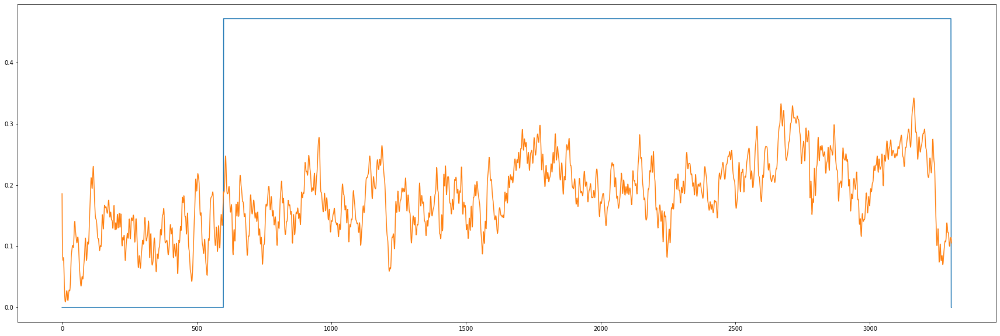

test epoch  21
(10, 3304)
(10, 3304)


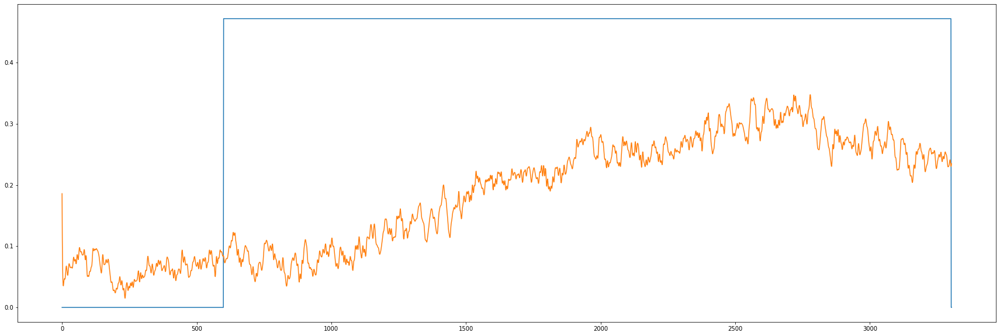

test epoch  22
(10, 3304)
(10, 3304)


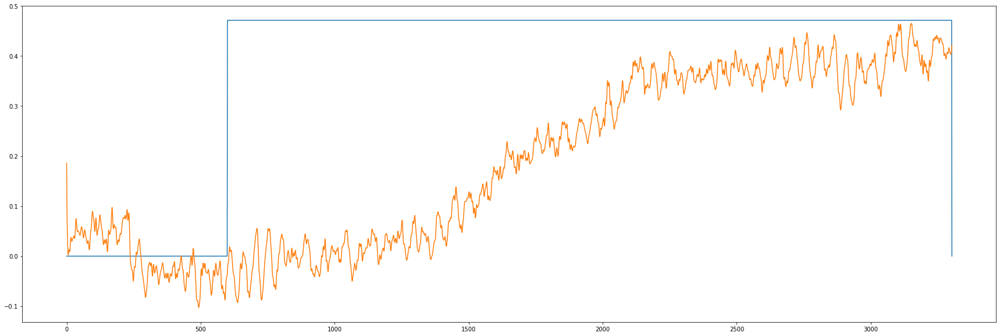

test epoch  23
(10, 3304)
(10, 3304)


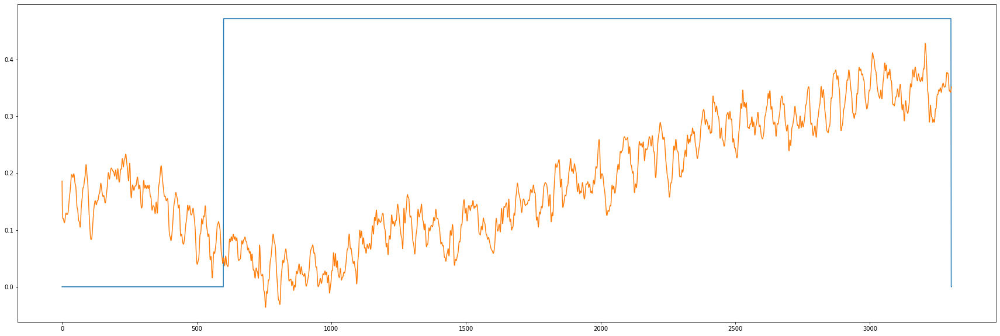

test epoch  0
(10, 3304)
(10, 3304)


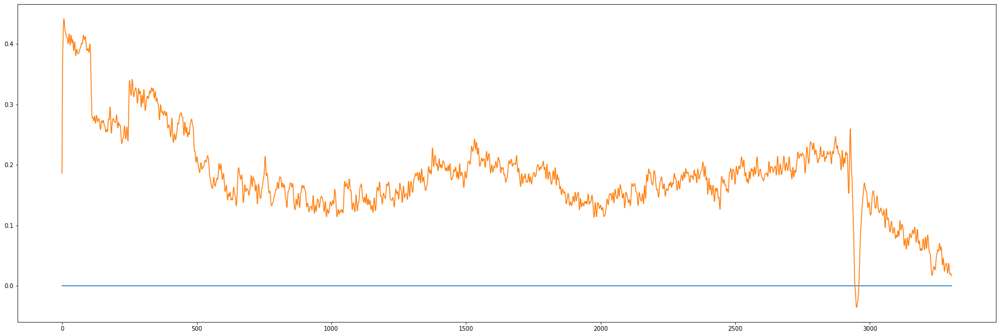

test epoch  1
(10, 3304)
(10, 3304)


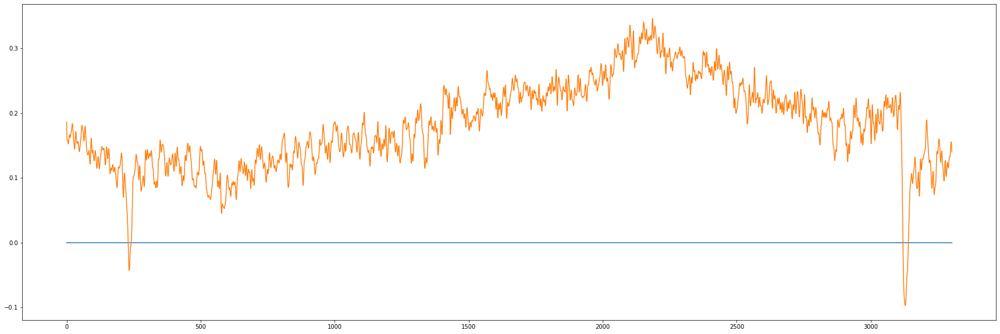

test epoch  2
(10, 3304)
(10, 3304)


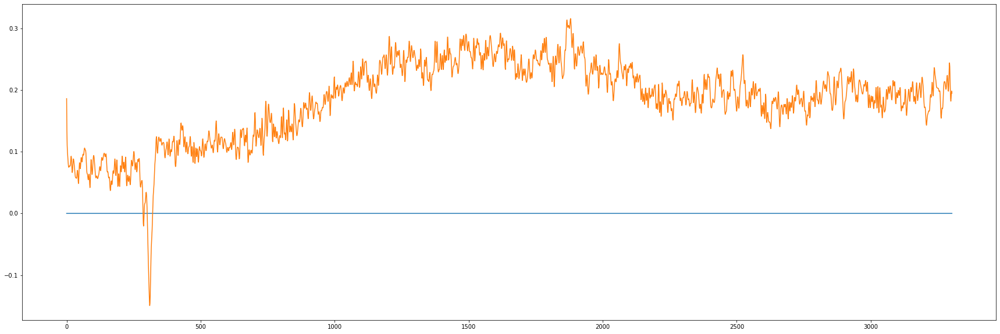

test epoch  3
(10, 3304)
(10, 3304)


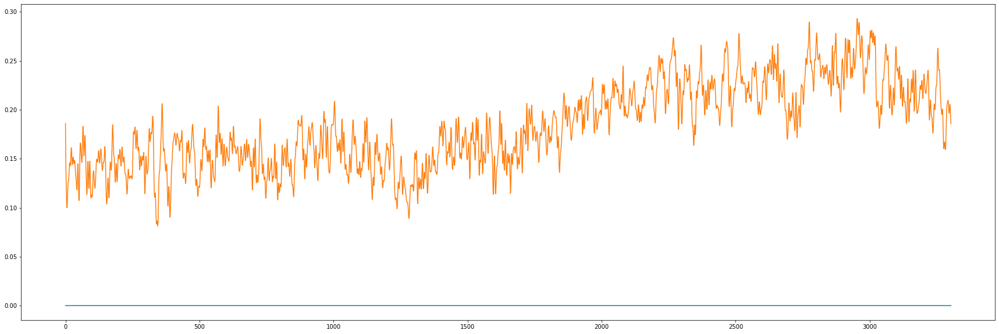

test epoch  4
(10, 3304)
(10, 3304)


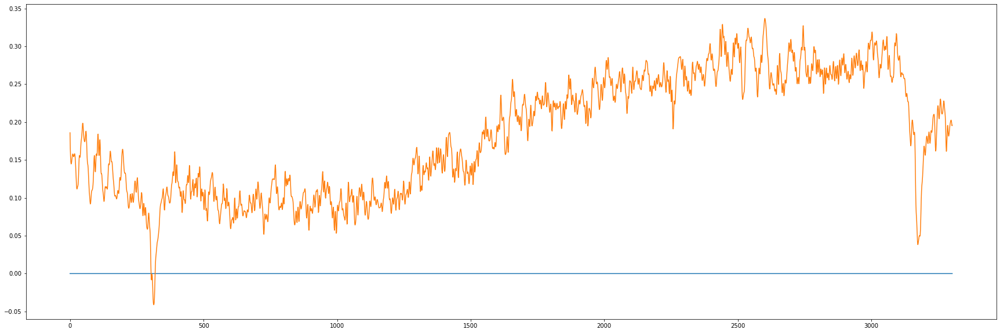

test epoch  5
(10, 3304)
(10, 3304)


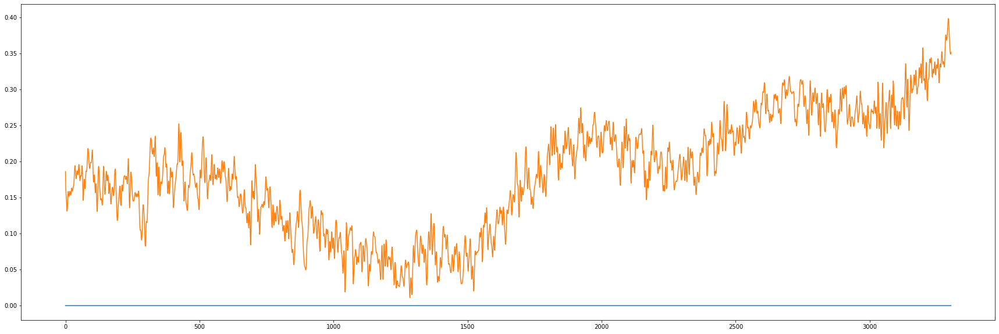

test epoch  6
(10, 3304)
(10, 3304)


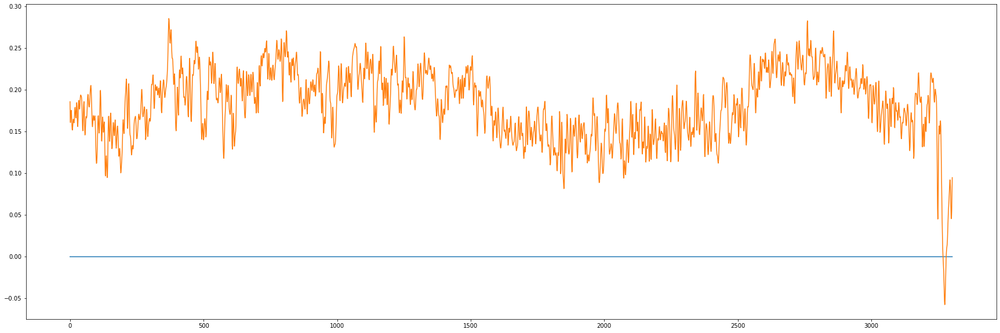

test epoch  7
(10, 3304)
(10, 3304)


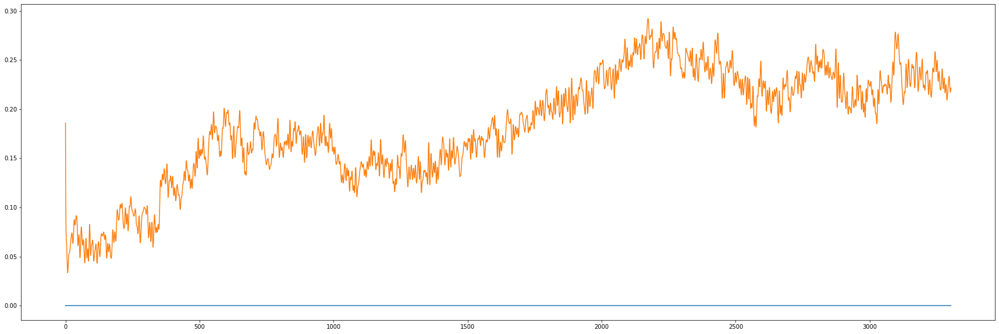

test epoch  8
(10, 3304)
(10, 3304)


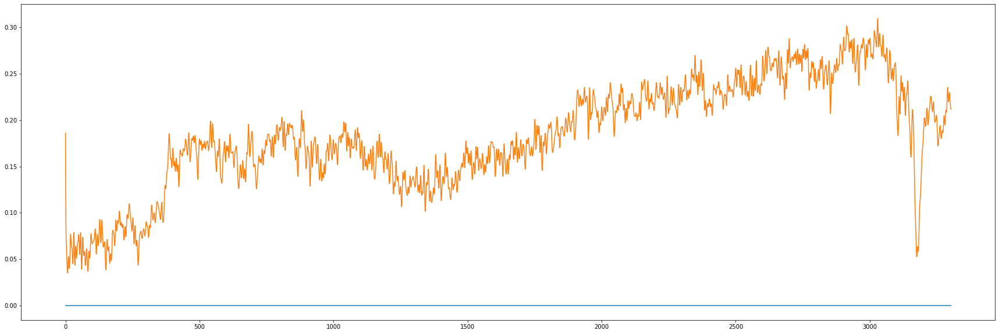

test epoch  9
(10, 3304)
(10, 3304)


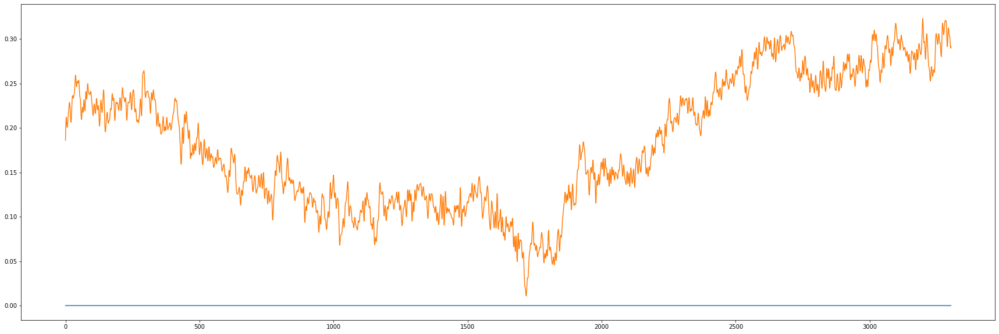

test epoch  10
(10, 3304)
(10, 3304)


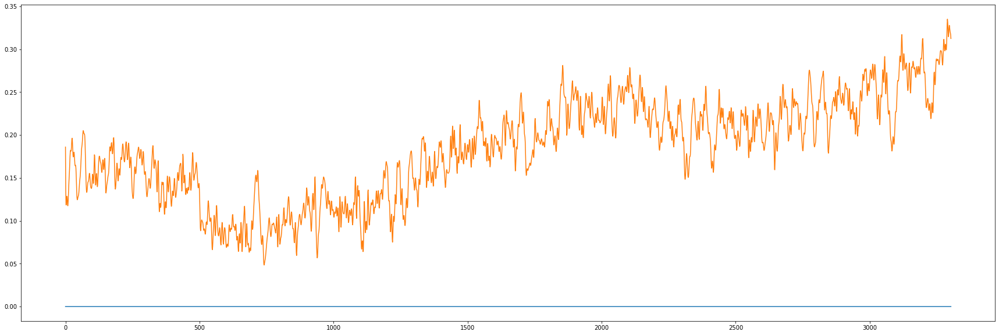

test epoch  11
(10, 3304)
(10, 3304)


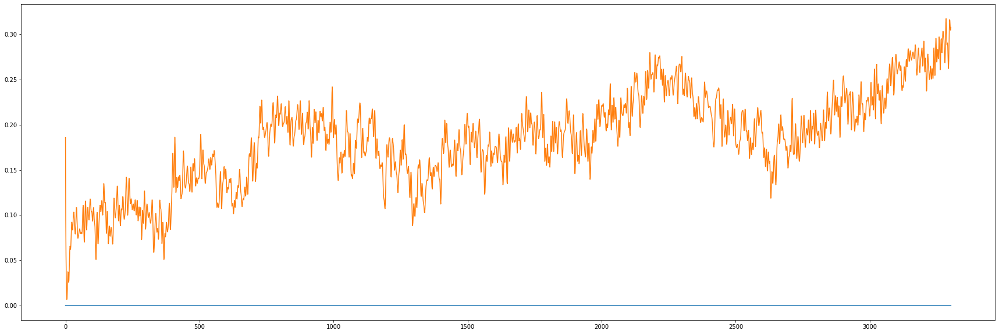

test epoch  12
(10, 3304)
(10, 3304)


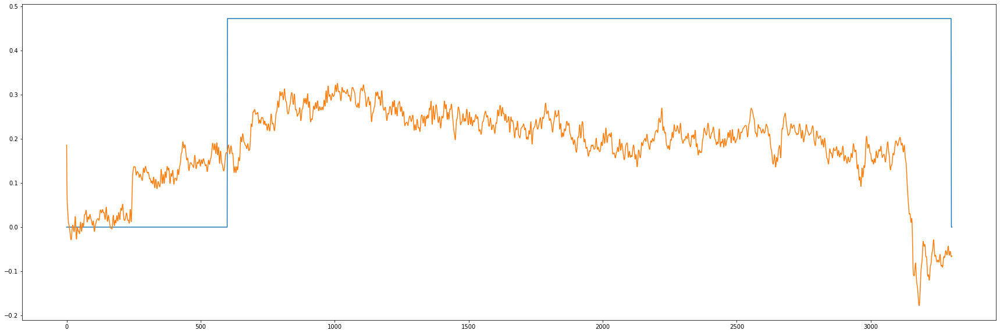

test epoch  13
(10, 3304)
(10, 3304)


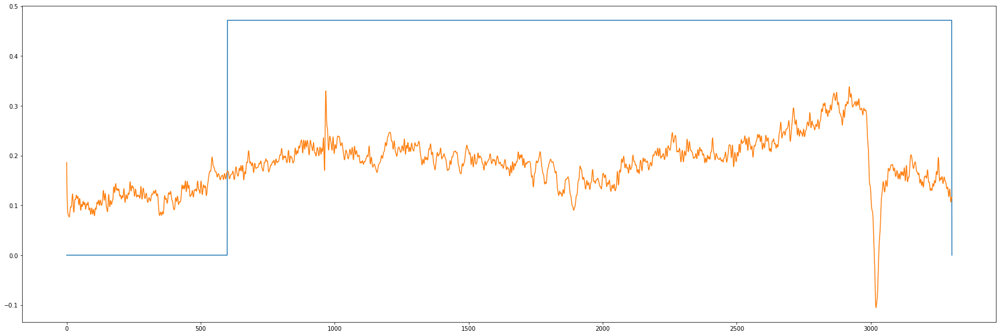

test epoch  14
(10, 3304)
(10, 3304)


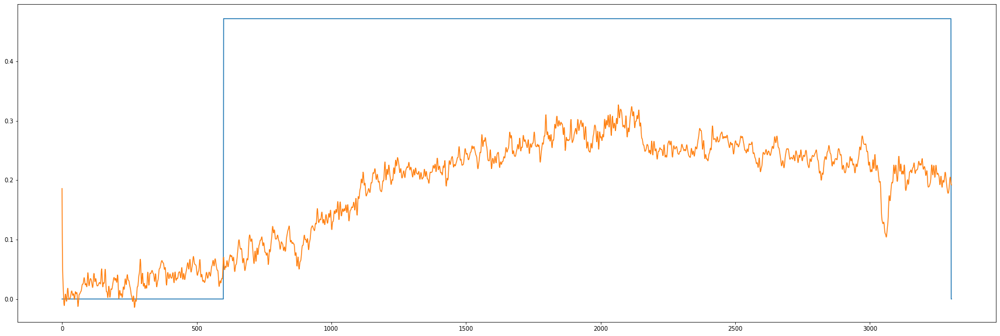

test epoch  15
(10, 3304)
(10, 3304)


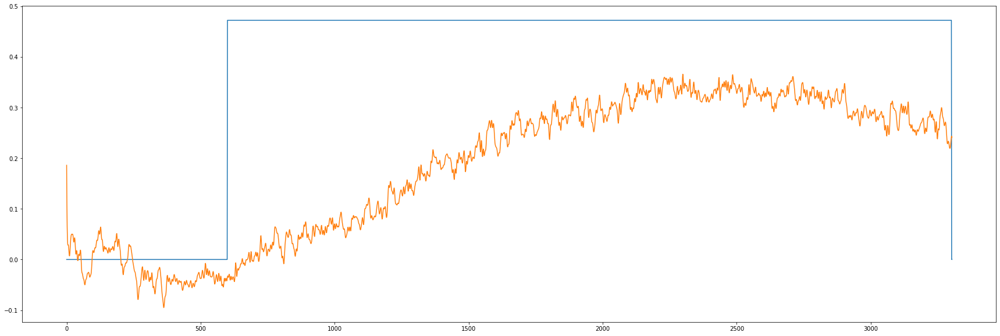

test epoch  16
(10, 3304)
(10, 3304)


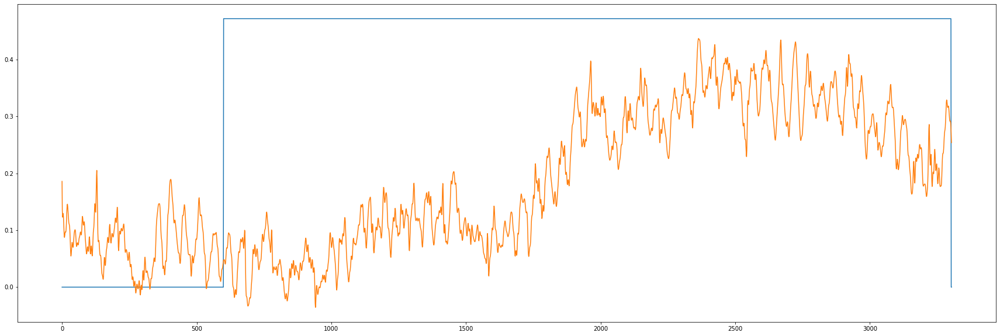

test epoch  17
(10, 3304)
(10, 3304)


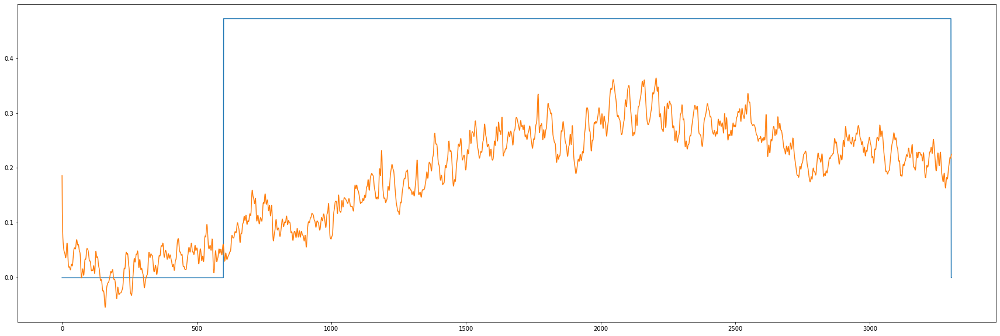

test epoch  18
(10, 3304)
(10, 3304)


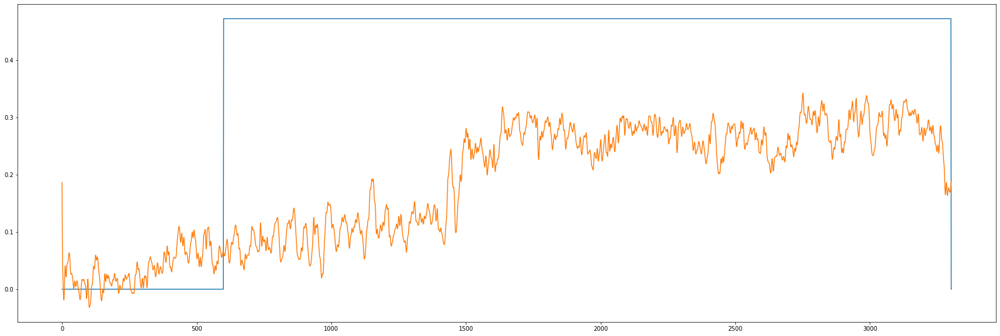

test epoch  19
(10, 3304)
(10, 3304)


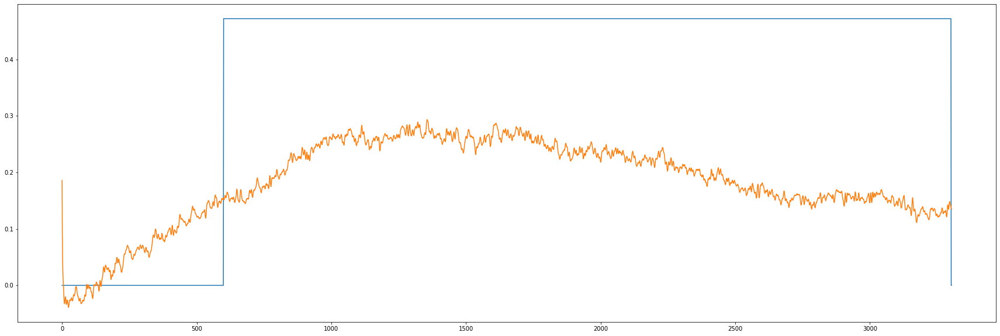

test epoch  20
(10, 3304)
(10, 3304)


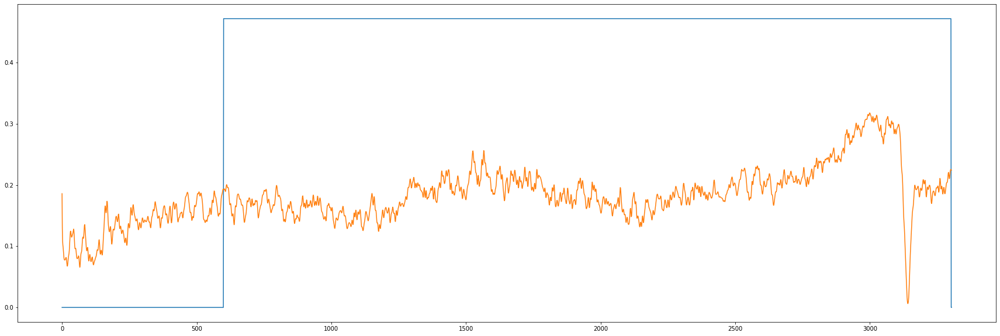

test epoch  21
(10, 3304)
(10, 3304)


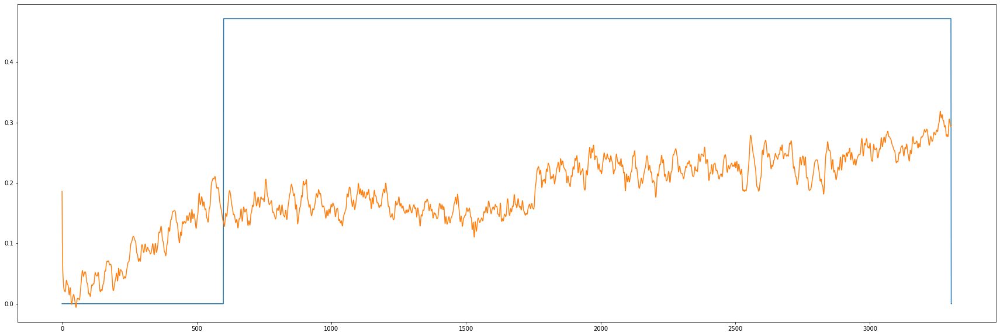

test epoch  22
(10, 3304)
(10, 3304)


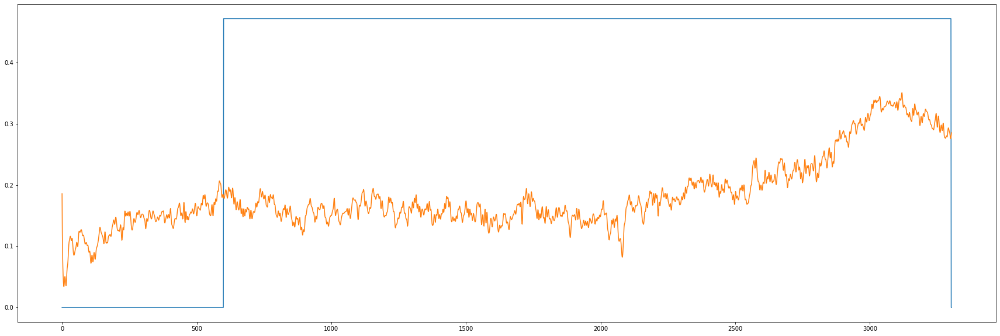

test epoch  23
(10, 3304)
(10, 3304)


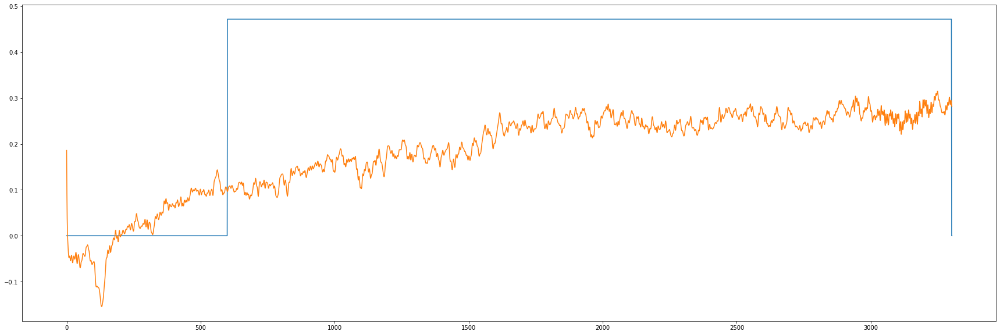

test epoch  0
(10, 3304)
(10, 3304)


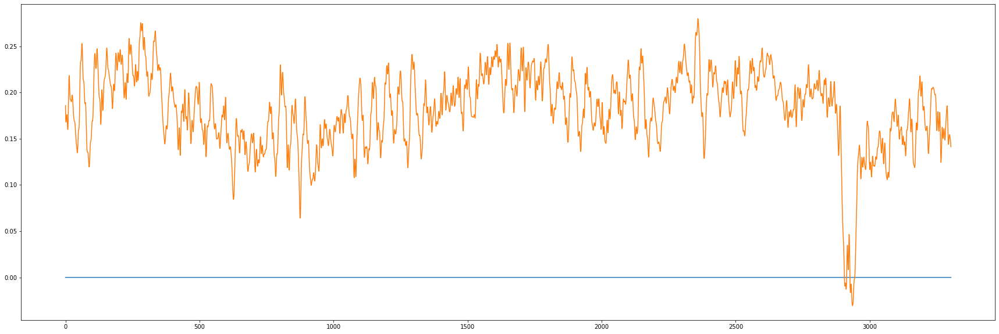

test epoch  1
(10, 3304)
(10, 3304)


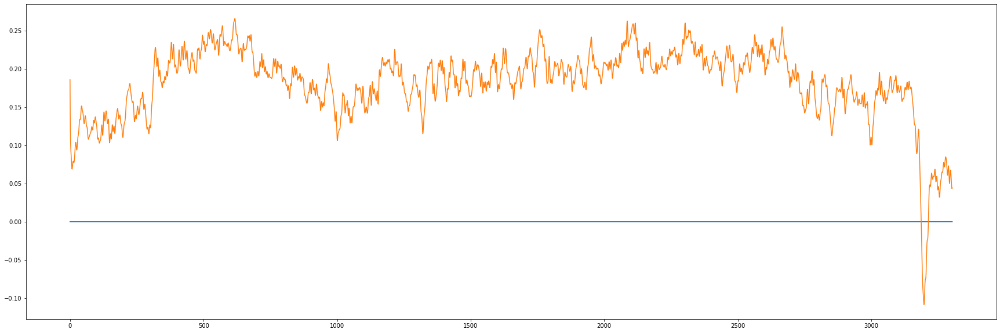

test epoch  2
(10, 3304)
(10, 3304)


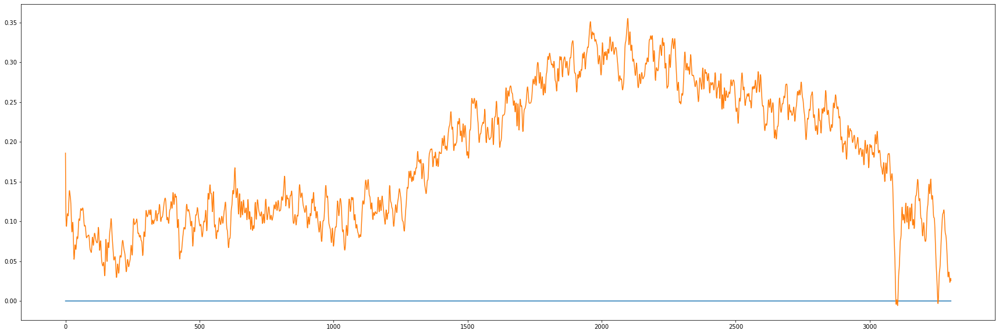

test epoch  3
(10, 3304)
(10, 3304)


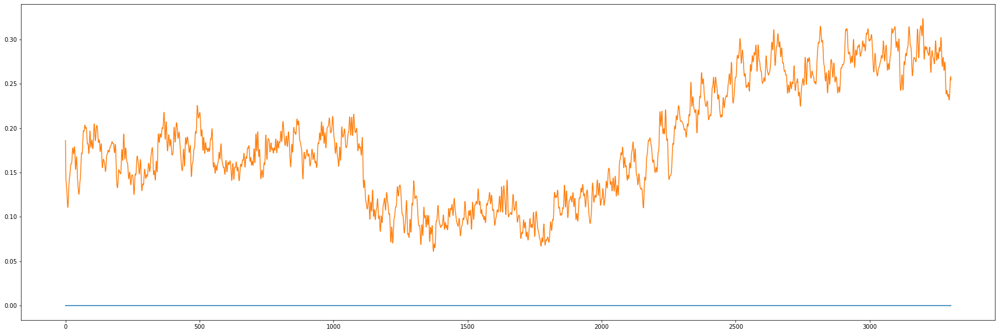

test epoch  4
(10, 3304)
(10, 3304)


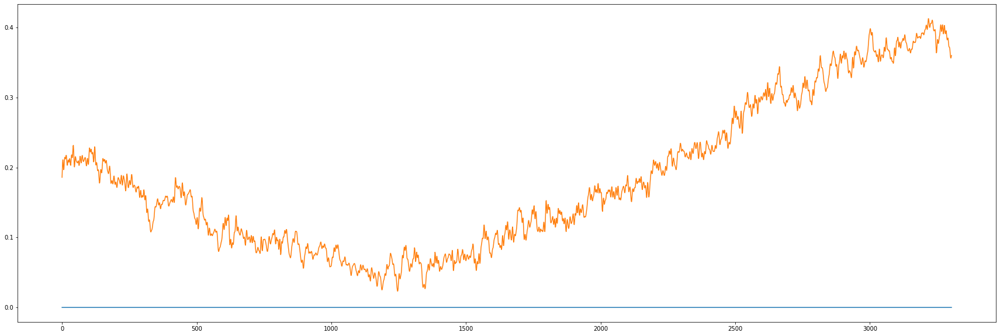

test epoch  5
(10, 3304)
(10, 3304)


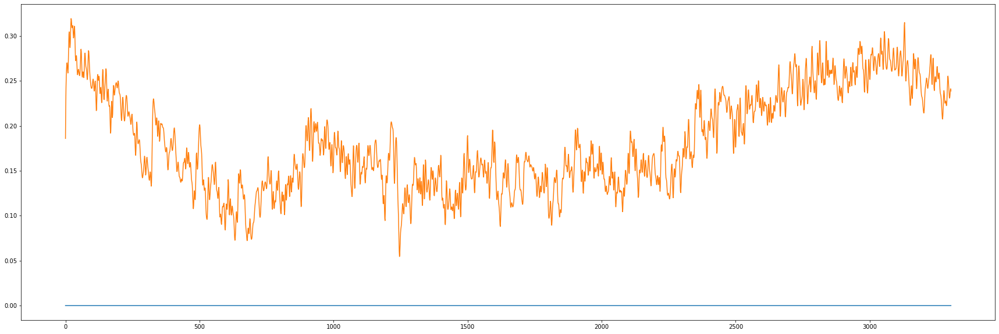

test epoch  6
(10, 3304)
(10, 3304)


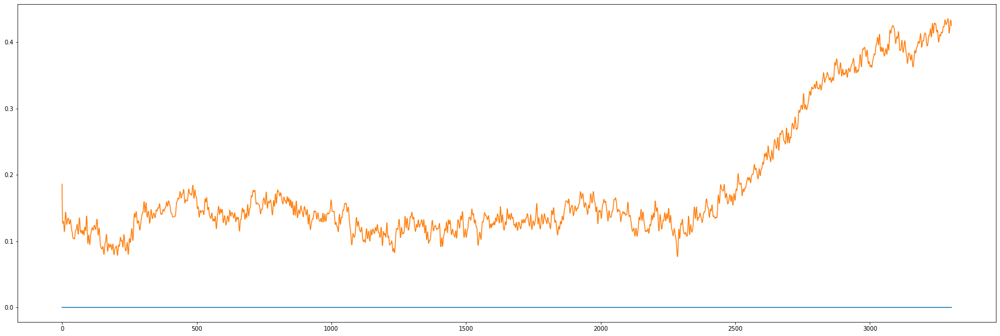

test epoch  7
(10, 3304)
(10, 3304)


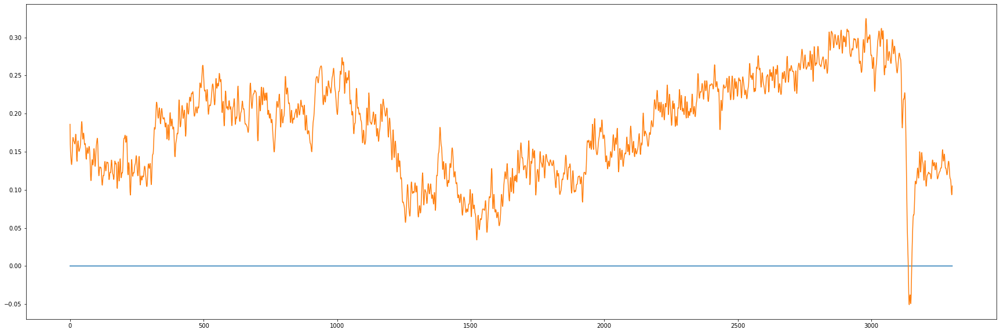

test epoch  8
(10, 3304)
(10, 3304)


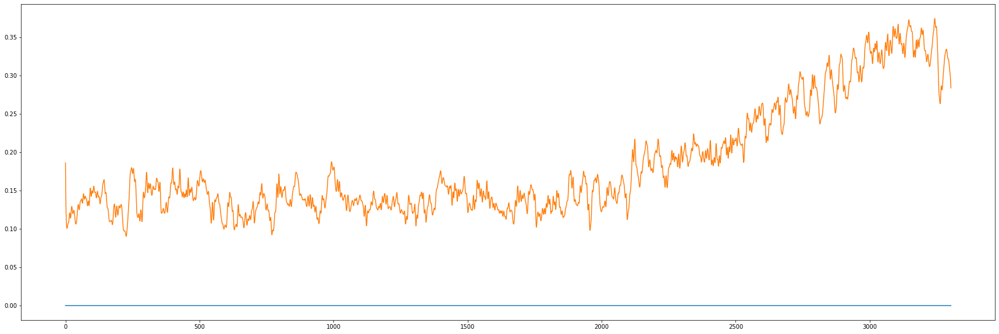

test epoch  9
(10, 3304)
(10, 3304)


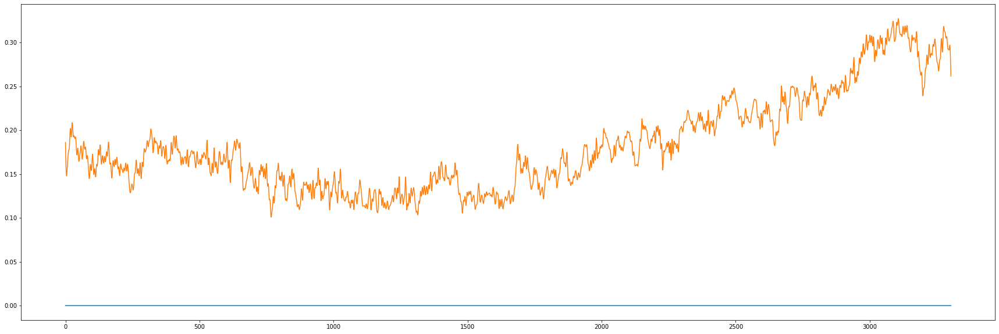

test epoch  10
(10, 3304)
(10, 3304)


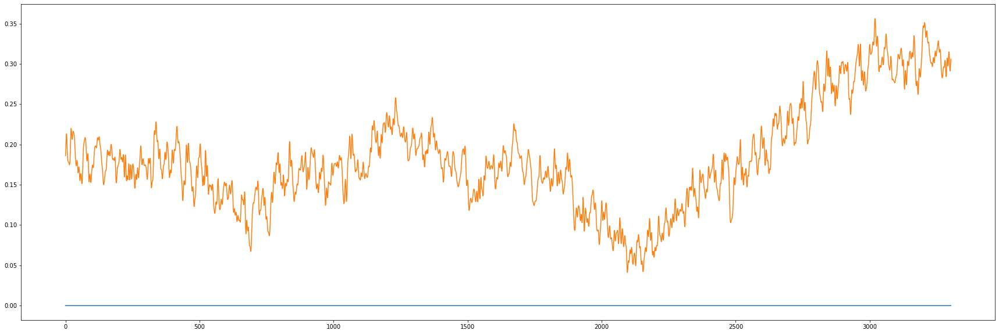

test epoch  11
(10, 3304)
(10, 3304)


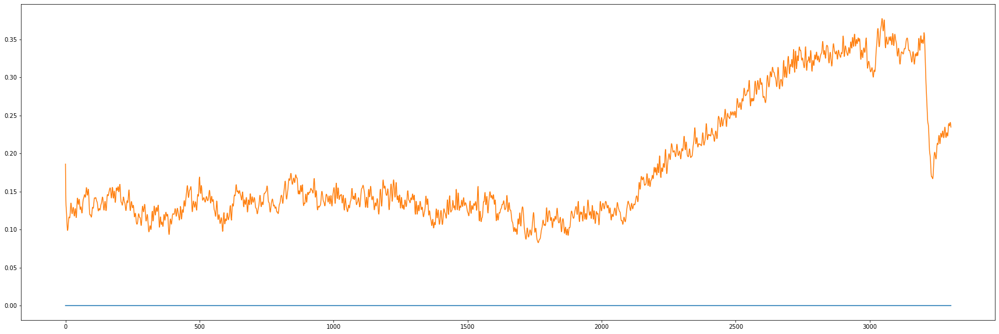

test epoch  12
(10, 3304)
(10, 3304)


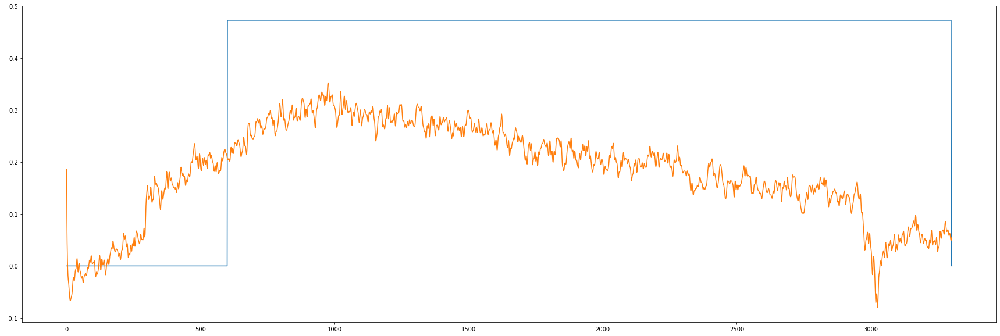

test epoch  13
(10, 3304)
(10, 3304)


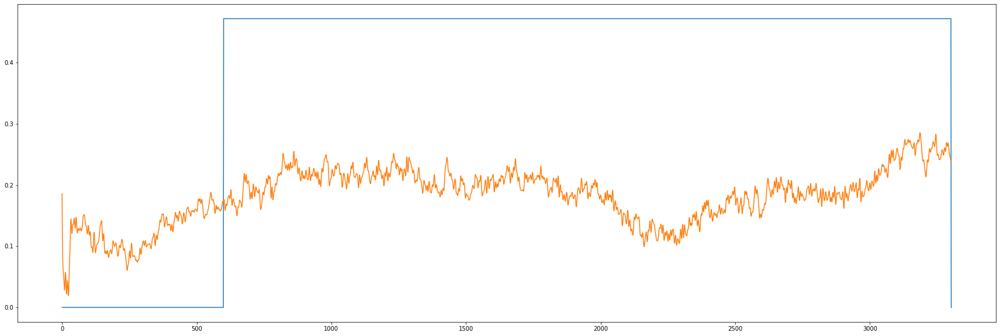

test epoch  14
(10, 3304)
(10, 3304)


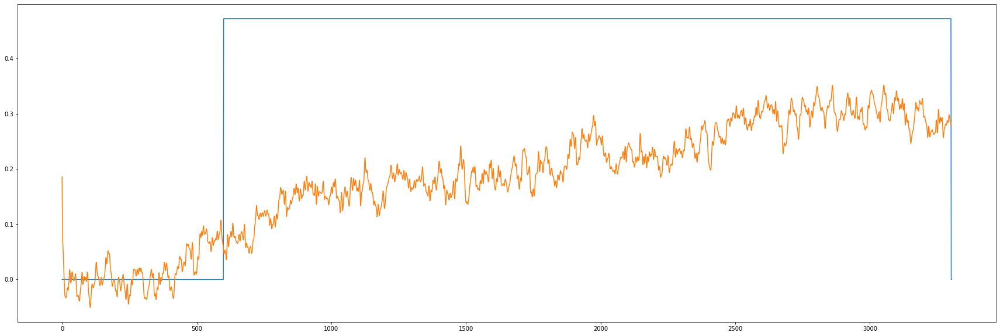

test epoch  15
(10, 3304)
(10, 3304)


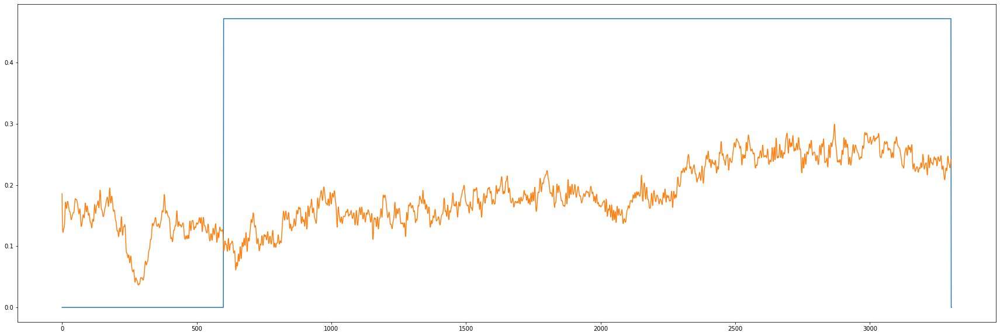

test epoch  16
(10, 3304)
(10, 3304)


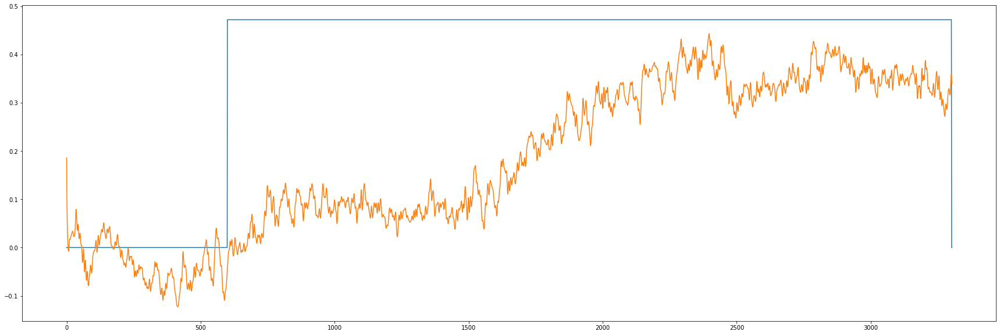

test epoch  17
(10, 3304)
(10, 3304)


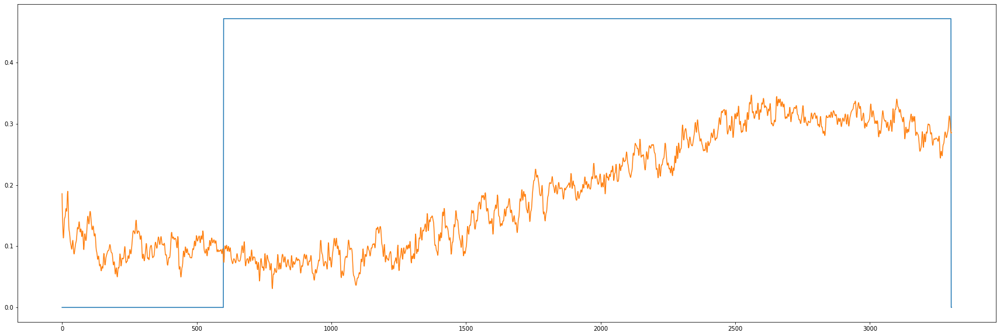

test epoch  18
(10, 3304)
(10, 3304)


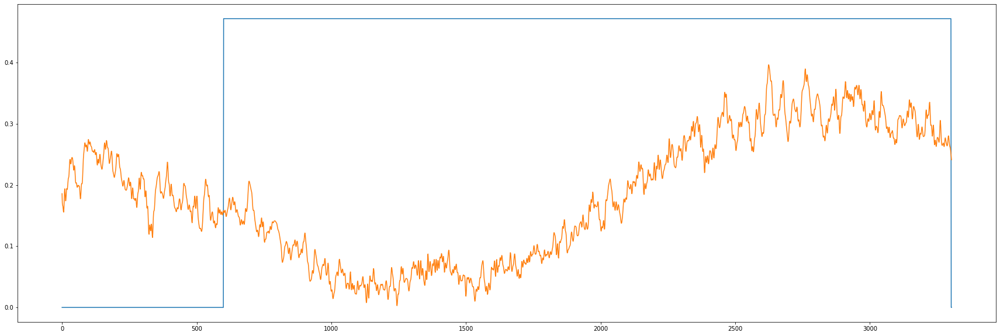

test epoch  19
(10, 3304)
(10, 3304)


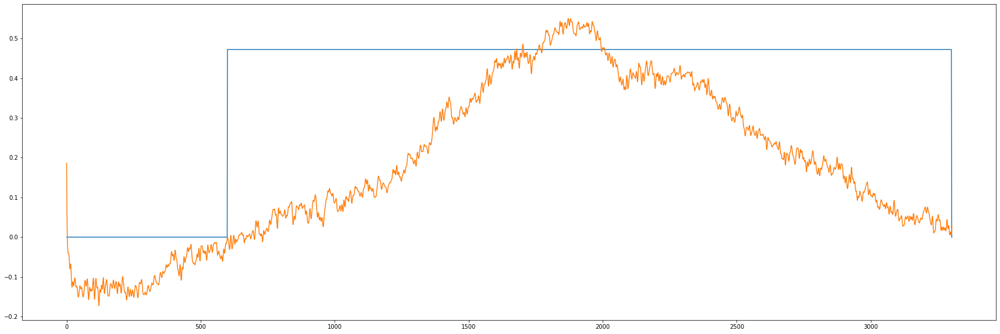

test epoch  20
(10, 3304)
(10, 3304)


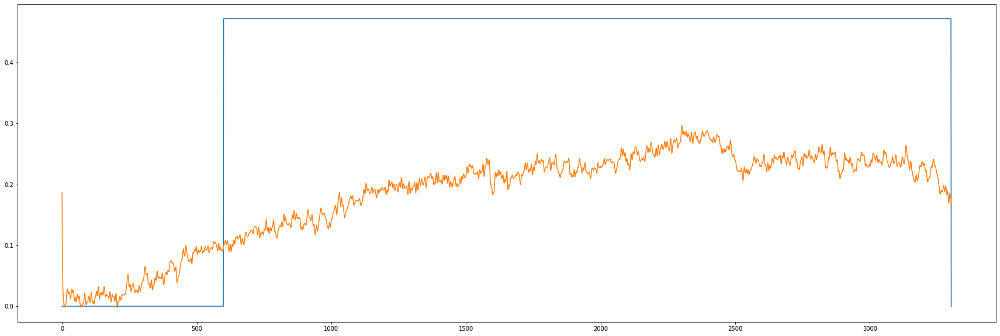

test epoch  21
(10, 3304)
(10, 3304)


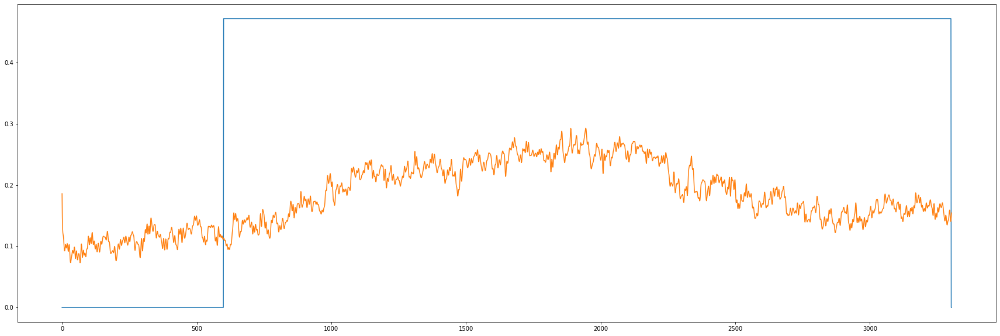

test epoch  22
(10, 3304)
(10, 3304)


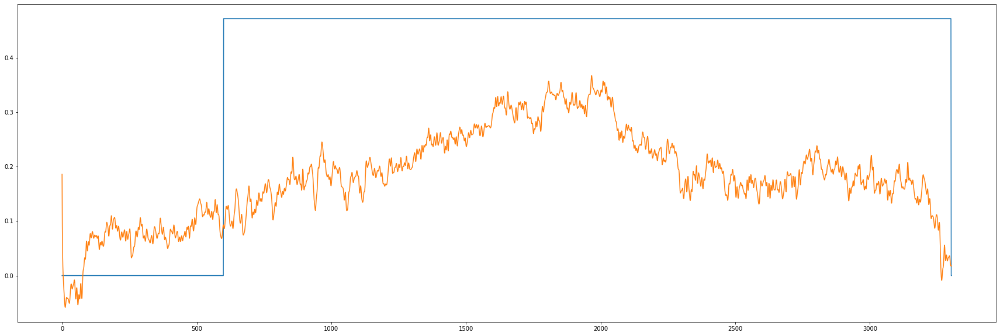

test epoch  23
(10, 3304)
(10, 3304)


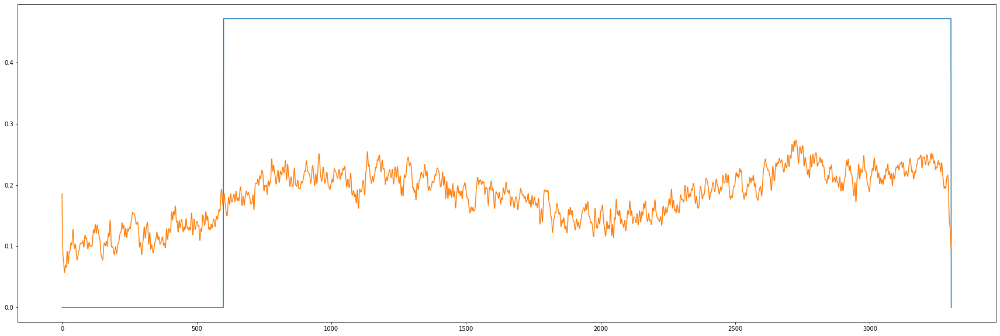

In [ ]:
for exp in exps:
    print("EXP ",exp)
    scores = []
    with open("results/psid_data_rec_" + exp + ".pickle", 'rb') as handle:
        result_dicts = pickle.load(handle)

    for rd in result_dicts:

        Z_true = rd["Z_true"]
        Z_pred = rd["Z_pred"]
        Y_true = rd["Y_true"]
        Y_pred = rd["Y_pred"]
        
        for ei in range(len(Z_true)):
            print("test epoch ", ei)
            print(Z_true[ei].shape)
            print(np.transpose(Z_pred[ei]).shape)
            print(np.transpose(Z_pred[ei]).shape)
            plt.figure(figsize = (30,10))
            plt.plot(Z_true[ei][-1])
            plt.plot(np.transpose(Z_pred[ei])[-1])
            plt.show()
            

In [ ]:
# STIM CLASSIFICATION

In [ ]:
model = xgb.XGBClassifier(max_depth=5,
                          n_estimators=10,
                          n_jobs=3,
                          eval_metric="logloss",
                          use_label_encoder=False)
scorer = make_scorer(accuracy_score)

In [ ]:
exps = [str(n) for n in [1,2,3,4,5,7]]

In [ ]:
for exp in exps:
    print("EXP ",exp)
    scores = []
    with open("results/psid_" + exp + ".pickle", 'rb') as handle:
        result_dicts = pickle.load(handle)
    print(len(result_dicts))

    for rd in result_dicts:

        X_train = rd["X_train"]
        X_test = rd["X_test"]
        y_train = rd["y_train"]
        y_test = rd["y_test"]


        model.fit(X_train, y_train)
        score = scorer(model, X_test, y_test)
        print(score)
        scores.append(score)
    print("MEAN ACC : ", np.mean(scores))

EXP  1
5
0.8333333333333334
0.6527777777777778
0.625
0.9027777777777778
0.6527777777777778
MEAN ACC :  0.7333333333333333
EXP  2
5
0.5555555555555556
0.4861111111111111
0.4305555555555556
0.4305555555555556
0.5277777777777778
MEAN ACC :  0.48611111111111116
EXP  3
3
0.4305555555555556
0.4861111111111111
0.3888888888888889
MEAN ACC :  0.4351851851851852
EXP  4
4
0.2916666666666667
0.5
0.5555555555555556
0.6805555555555556
MEAN ACC :  0.5069444444444444
EXP  5
5
0.4583333333333333
0.75
0.8055555555555556
0.75
0.75
MEAN ACC :  0.7027777777777777
EXP  7
7
0.6388888888888888
0.6805555555555556
0.6388888888888888
0.5972222222222222
0.5416666666666666
0.5694444444444444
0.4583333333333333
MEAN ACC :  0.5892857142857142


In [ ]:
exps

['1', '2', '3', '4', '5']